# Data Mining Project 2021 - 2022

## Group X
#### Tomás Jordão 20210664
#### David Santos xxxxxxxx
#### Foazul Islam 20200750

**Table of Contents** <br>
* [1.Import Libraries](#importlibraries)
* [2.Import Dataset](#importdataset)
* [3. Data Exploration](#initialanalysis)
    * [3.1. Checking Incoherences](#chekingincoherences)
* [4. Pre-Processing](#preprocessing)
    * [4.1. Metric and Non-Metric Features](#metricnonmetric)
    * [4.2. Missing Values](#missingvalues)
    * [4.3. Filling Missing Values](#fillmissingvalues)
    * [4.4. Creating New Variables](#newvars)
    * [4.5. Relationship of Numerical Variables](#relationbetweenvars)
* [5. Outliers](#outliers)
    * [5.1. Checking for Outliers](#chekingoutliers)
    * [5.2. Removing Outliers by Experimentation](#removingoutliers1)
    * [5.3. Removing Outliers by Variables Distribution](#removingoutliers2)
    * [5.4. Removing Outliers with IQR](#removingoutliers3)
    * [5.5. Removing Outliers with Z-Score](#removingoutliers4)
    * [5.6. Removing Outliers with LOF](#removingoutliers5)
    * [5.7. Removing Outliers with OneClassSVM](#removingoutliers6)
    * [5.8. Removing Outliers with DBSCAN](#removingoutliers7)
* [6. Relevancy and Redundancy](#relandredun)
    * [6.1. Relation Between Variables](#relbetvars)
    * [6.2. Correlation](#correlation)
* [7. Normalization](#normalization)
* [8. One Hot Encoding](#ohc)
* [9. PCA](#pca)
* [10. Cluestering](#clustering)
    * [10.1. Hierarchical Clustering](#hc)
    * [10.2. K-Means](#kmeans)


<hr>
<a class="anchor" id="importlibraries">
    
# 1. Import libraries
    
</a>

In [513]:
#importing the necessary libraries
import sqlite3
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from math import ceil
from datetime import datetime
from sklearn.impute import KNNImputer
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder
from sklearn.decomposition import PCA
import matplotlib.cm as cm
from sklearn.metrics import silhouette_score, silhouette_samples
sns.set()

#outliers
from scipy import stats
from sklearn.neighbors import LocalOutlierFactor
from sklearn.svm import OneClassSVM

from itertools import product
from pandas_profiling import ProfileReport

#Clustering
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import KMeans
from sklearn.cluster import MeanShift, DBSCAN, estimate_bandwidth

# Self organization method
import sompy
from sompy.visualization.mapview import View2D
from sompy.visualization.bmuhits import BmuHitsView
from sompy.visualization.hitmap import HitMapView

# Density Based Clustering
from sklearn.neighbors import NearestNeighbors
from sklearn.mixture import GaussianMixture
from sklearn.cluster import MeanShift, DBSCAN, estimate_bandwidth

# Cluster Analysis
from sklearn.base import clone
from sklearn.metrics import pairwise_distances
from sklearn.manifold import TSNE
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.model_selection import train_test_split
import graphviz

import warnings
warnings.filterwarnings("ignore")


%matplotlib inline

%config InlineBackend.figure_format = 'retina' 

<hr>
<a class="anchor" id="importdataset">
    
# 2. Import Dataset
    
</a>

In [514]:
data = pd.read_sas('a2z_insurance.sas7bdat')

<hr>
<a class="anchor" id="initialanalysis">
    
# 3. Data Exploration
    
</a>

In [515]:
data.set_index('CustID', inplace = True)

In [516]:
data.head()
#na segunda observação o cliente é cliente à mais anos do que tem de vida

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
1.0,1985.0,1982.0,b'2 - High School',2177.0,1.0,1.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89
2.0,1981.0,1995.0,b'2 - High School',677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
3.0,1991.0,1970.0,b'1 - Basic',2277.0,3.0,0.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
4.0,1990.0,1981.0,b'3 - BSc/MSc',1099.0,4.0,1.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
5.0,1986.0,1973.0,b'3 - BSc/MSc',1763.0,4.0,1.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45


In [517]:
data.info()
# the variable children most changed to boolean type
# birthyear, custid and firstpolyear most be changed to int

<class 'pandas.core.frame.DataFrame'>
Float64Index: 10296 entries, 1.0 to 10296.0
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   FirstPolYear   10266 non-null  float64
 1   BirthYear      10279 non-null  float64
 2   EducDeg        10279 non-null  object 
 3   MonthSal       10260 non-null  float64
 4   GeoLivArea     10295 non-null  float64
 5   Children       10275 non-null  float64
 6   CustMonVal     10296 non-null  float64
 7   ClaimsRate     10296 non-null  float64
 8   PremMotor      10262 non-null  float64
 9   PremHousehold  10296 non-null  float64
 10  PremHealth     10253 non-null  float64
 11  PremLife       10192 non-null  float64
 12  PremWork       10210 non-null  float64
dtypes: float64(12), object(1)
memory usage: 1.1+ MB


<hr>
<a class="anchor" id="chekingincoherences">
    
# 3.1. Cheking Incoherences
    
</a>

In [518]:
# checking for incoherences
min_age = min(data.BirthYear)
max_age = max(data.BirthYear)
print(min_age)
print(max_age)

1028.0
2001.0


In [519]:
# checking for people with over 100 years
data[data.BirthYear < 1916]
# remove this observation

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
7196.0,1993.0,1028.0,b'3 - BSc/MSc',2830.0,4.0,0.0,146.02,0.77,428.97,192.8,108.91,1.89,23.67


In [520]:
# # dropping the observation
# data.drop(index = 7196, inplace = True)
# # confirmation
# data[data.BirthYear < 1916]

In [521]:
# percentage of the data where age is smaller than number of years as a customer
(sum(data.BirthYear > data.FirstPolYear) / data.shape[0]) * 100
# the percentage is to high for the removal of the data

19.395881895881896

In [522]:
# checking the youngest people
data[data.BirthYear == 2001]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
660.0,1991.0,2001.0,b'1 - Basic',1284.0,4.0,1.0,243.50,0.81,46.23,1079.65,72.68,252.27,-10.00
690.0,1997.0,2001.0,b'1 - Basic',1180.0,3.0,1.0,436.10,0.48,54.90,406.20,65.79,112.02,256.05
866.0,1979.0,2001.0,b'1 - Basic',562.0,1.0,1.0,1113.78,0.11,40.34,847.95,94.24,178.70,112.13
1437.0,1989.0,2001.0,b'1 - Basic',823.0,4.0,0.0,281.28,0.60,129.58,177.80,58.01,176.70,218.15
2580.0,1986.0,2001.0,b'1 - Basic',1006.0,4.0,0.0,267.95,0.67,48.23,396.75,291.50,127.58,24.45
3147.0,1994.0,2001.0,b'1 - Basic',372.0,4.0,1.0,488.76,0.36,60.68,270.60,177.59,182.48,107.13
4466.0,1978.0,2001.0,b'1 - Basic',958.0,4.0,0.0,-204.59,1.11,28.56,1359.15,68.79,38.23,179.59
4484.0,1983.0,2001.0,b'1 - Basic',1241.0,3.0,1.0,909.17,0.13,43.34,589.55,142.47,121.80,179.48
5348.0,1980.0,2001.0,b'1 - Basic',1119.0,3.0,1.0,796.71,0.23,148.14,628.45,221.82,45.12,30.23


In [523]:
# checking the caracheteristics of the people in the incoherence 
data[data.BirthYear > data.FirstPolYear].describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
FirstPolYear,1997,NaN,NaN,NaN,1982.23,5.53194,1974,1978,1981,1986,1998
BirthYear,1997,NaN,NaN,NaN,1990.63,5.74726,1975,1986,1991,1995,2001
EducDeg,1996,4,b'2 - High School',685,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MonthSal,1985,NaN,NaN,NaN,1332.64,875.567,333,985,1290,1640,34490
GeoLivArea,1997,NaN,NaN,NaN,2.69354,1.27415,1,1,3,4,4
Children,1994,NaN,NaN,NaN,0.830993,0.374852,0,1,1,1,1
CustMonVal,1997,NaN,NaN,NaN,246.387,445.11,-10107.4,-1.33,187.25,436.1,2054.07
ClaimsRate,1997,NaN,NaN,NaN,0.711427,0.512061,0,0.42,0.73,0.97,13.9
PremMotor,1989,NaN,NaN,NaN,177.668,122.51,-4.11,71.57,149.36,264.16,542.99
PremHousehold,1997,NaN,NaN,NaN,375.758,327.502,-75,122.25,285.6,564.55,2223.75


In [524]:
#proposal
# they are customers as many years as they are alive ????
# removing doesn't seem to be a option
# see the age and assume the number of years they can be a customer??
# using Customer Monetary Value ??? but what is aquisition cost?? profit total of premiuns - amount paid from Claims Rate???
# if i assume that the other observations are correct may I retrieve the aquisition cost

In [525]:
# best option
# removing the variables
data.drop(columns = ['FirstPolYear', 'BirthYear'], inplace = True )

<hr>
<a class="anchor" id="preprocessing">
    
# 4. Pre-processing
    
</a>

<hr>
<a class="anchor" id="metricnonmetric">
    
# 4.1. Metric and Non-Metric Features
    
</a>

In [526]:
non_metric_features = ["EducDeg", "Children", "GeoLivArea"]
metric_features = data.columns.drop(non_metric_features).to_list()

<hr>
<a class="anchor" id="missingvalues">
    
# 4.2. Missing Values
    
</a>

In [527]:
#cheking for missing values
data.isna().sum()
#multiple variables with missing values

EducDeg           17
MonthSal          36
GeoLivArea         1
Children          21
CustMonVal         0
ClaimsRate         0
PremMotor         34
PremHousehold      0
PremHealth        43
PremLife         104
PremWork          86
dtype: int64

<hr>
<a class="anchor" id="fillmissingvalues">
    
# 4.3. Filling Missing Values
    
</a>

In [528]:
#filling metric features with the median
data.fillna(data.median(), inplace=True)
#filling non-metric features with the mode
data.fillna(data[non_metric_features].mode().loc[0], inplace=True)

data.isna().sum()  # checking how many NaNs we still have

EducDeg          0
MonthSal         0
GeoLivArea       0
Children         0
CustMonVal       0
ClaimsRate       0
PremMotor        0
PremHousehold    0
PremHealth       0
PremLife         0
PremWork         0
dtype: int64

In [529]:
# checking the distribution of the variables
data.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
EducDeg,10296,4,b'3 - BSc/MSc',4816,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MonthSal,10296,NaN,NaN,NaN,2506.65,1155.42,333,1708.5,2501.5,3289,55215
GeoLivArea,10296,NaN,NaN,NaN,2.70989,1.26623,1,1,3,4,4
Children,10296,NaN,NaN,NaN,0.707362,0.454996,0,0,1,1,1
CustMonVal,10296,NaN,NaN,NaN,177.893,1945.81,-165680,-9.44,186.87,399.778,11875.9
ClaimsRate,10296,NaN,NaN,NaN,0.742772,2.91696,0,0.39,0.72,0.98,256.2
PremMotor,10296,NaN,NaN,NaN,300.464,211.565,-4.11,191.343,298.61,407.52,11604.4
PremHousehold,10296,NaN,NaN,NaN,210.431,352.596,-75,49.45,132.8,290.05,25048.8
PremHealth,10296,NaN,NaN,NaN,171.544,295.787,-2.11,111.91,162.81,218.957,28272
PremLife,10296,NaN,NaN,NaN,41.6912,47.2683,-7,9.89,25.56,57.01,398.3


In [502]:
# #correcting the variables types
# data.Children = data.Children.astype("boolean")  

In [530]:
data.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
EducDeg,10296,4,b'3 - BSc/MSc',4816,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MonthSal,10296,NaN,NaN,NaN,2506.65,1155.42,333,1708.5,2501.5,3289,55215
GeoLivArea,10296,NaN,NaN,NaN,2.70989,1.26623,1,1,3,4,4
Children,10296,NaN,NaN,NaN,0.707362,0.454996,0,0,1,1,1
CustMonVal,10296,NaN,NaN,NaN,177.893,1945.81,-165680,-9.44,186.87,399.778,11875.9
ClaimsRate,10296,NaN,NaN,NaN,0.742772,2.91696,0,0.39,0.72,0.98,256.2
PremMotor,10296,NaN,NaN,NaN,300.464,211.565,-4.11,191.343,298.61,407.52,11604.4
PremHousehold,10296,NaN,NaN,NaN,210.431,352.596,-75,49.45,132.8,290.05,25048.8
PremHealth,10296,NaN,NaN,NaN,171.544,295.787,-2.11,111.91,162.81,218.957,28272
PremLife,10296,NaN,NaN,NaN,41.6912,47.2683,-7,9.89,25.56,57.01,398.3


<hr>
<a class="anchor" id="newvars">
    
# 4.4. Creating New Variables
    
</a>

In [531]:
# It is created a new dataframe so that any change does not affect the original data
df = data.copy()

In [532]:
#Feature Engeneering
# avg_spend_premiuns - average spend on premiuns by number od years as customer
df['Avg_Premiuns'] = (df['PremHousehold']+df['PremHealth']+df['PremLife']+df['PremWork'] + df['PremMotor']) / 5


In [533]:
# checking if everything is correct
df.head()

,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns
CustID,,,,,,,,,,,,
1.0,b'2 - High School',2177.0,1.0,1.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89,133.112
2.0,b'2 - High School',677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13,182.192
3.0,b'1 - Basic',2277.0,3.0,0.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02,148.120
4.0,b'3 - BSc/MSc',1099.0,4.0,1.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34,120.136
5.0,b'3 - BSc/MSc',1763.0,4.0,1.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45,125.848


In [534]:
#adding the new variable to the metric features
metric_features.append('Avg_Premiuns')
metric_features

['MonthSal',
 'CustMonVal',
 'ClaimsRate',
 'PremMotor',
 'PremHousehold',
 'PremHealth',
 'PremLife',
 'PremWork',
 'Avg_Premiuns']

In [535]:
# confirmation that everything is correct with the data types
df.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 10296 entries, 1.0 to 10296.0
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   EducDeg        10296 non-null  object 
 1   MonthSal       10296 non-null  float64
 2   GeoLivArea     10296 non-null  float64
 3   Children       10296 non-null  float64
 4   CustMonVal     10296 non-null  float64
 5   ClaimsRate     10296 non-null  float64
 6   PremMotor      10296 non-null  float64
 7   PremHousehold  10296 non-null  float64
 8   PremHealth     10296 non-null  float64
 9   PremLife       10296 non-null  float64
 10  PremWork       10296 non-null  float64
 11  Avg_Premiuns   10296 non-null  float64
dtypes: float64(11), object(1)
memory usage: 1.0+ MB


In [536]:
# distribution of the variables after the filling of missing values and creation of new variables
df.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
EducDeg,10296,4,b'3 - BSc/MSc',4816,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MonthSal,10296,NaN,NaN,NaN,2506.65,1155.42,333,1708.5,2501.5,3289,55215
GeoLivArea,10296,NaN,NaN,NaN,2.70989,1.26623,1,1,3,4,4
Children,10296,NaN,NaN,NaN,0.707362,0.454996,0,0,1,1,1
CustMonVal,10296,NaN,NaN,NaN,177.893,1945.81,-165680,-9.44,186.87,399.778,11875.9
ClaimsRate,10296,NaN,NaN,NaN,0.742772,2.91696,0,0.39,0.72,0.98,256.2
PremMotor,10296,NaN,NaN,NaN,300.464,211.565,-4.11,191.343,298.61,407.52,11604.4
PremHousehold,10296,NaN,NaN,NaN,210.431,352.596,-75,49.45,132.8,290.05,25048.8
PremHealth,10296,NaN,NaN,NaN,171.544,295.787,-2.11,111.91,162.81,218.957,28272
PremLife,10296,NaN,NaN,NaN,41.6912,47.2683,-7,9.89,25.56,57.01,398.3


<hr>
<a class="anchor" id="relationbetweenvars">
    
# 4.5. Relationship of Numerical Variables
    
</a>

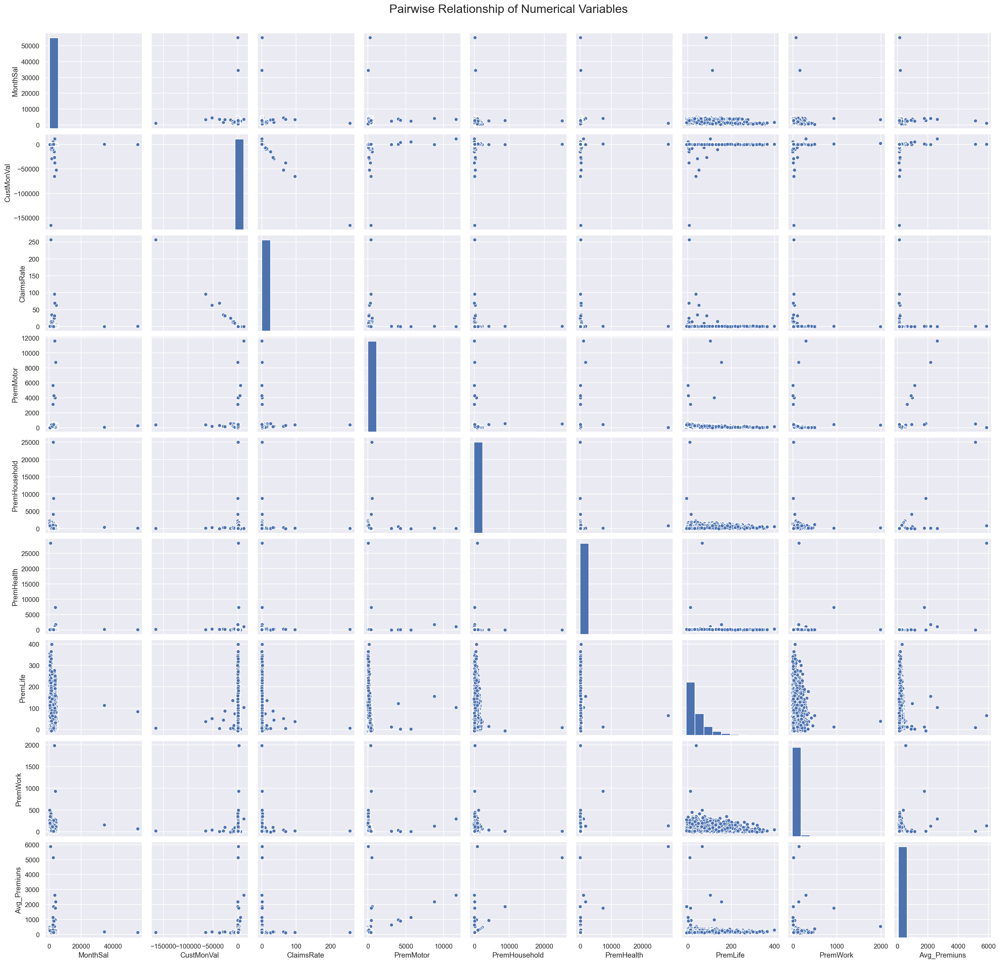

In [537]:
# Pairwise Relationship of Numerical Variables
sns.set()

# Setting pairplot
sns.pairplot(df[metric_features], diag_kind="hist")

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=20)

plt.show()

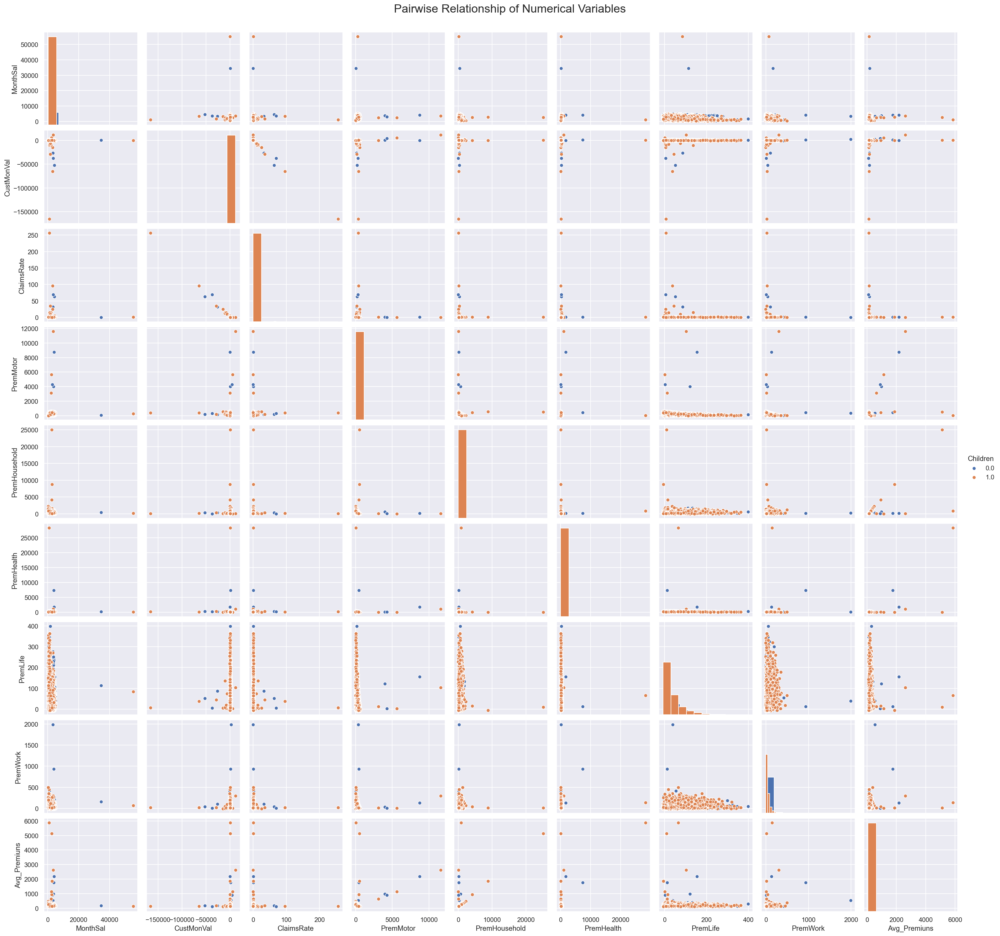

In [538]:
# Pairwise Relationship of Numerical Variables considering if they have children or not
sns.set()

# Setting pairplot
sns.pairplot(df[metric_features + ['Children']], diag_kind="hist", hue='Children')

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=20)

plt.show()

<hr>
<a class="anchor" id="outliers">
    
# 5. Outliers
    
</a>

<hr>
<a class="anchor" id="chekingoutliers">
    
# 5.1. Checking for Outliers
    
</a>

In [539]:
# checking the values of the variables
# some of this thresholds are can be disputed because of the type of variables
#salary
df[df.MonthSal > 5500] # 5500 parece-me ser um bom threshold
# Customer Value
df[df.CustMonVal > 2100] # 2100 parece-me ser um bom threshold, mas serão verdadeiros outliers
df[df.CustMonVal < -10500] # 2100 parece-me ser um bom threshold, mas serão verdadeiros outliers
#Claims Rate
df[df.ClaimsRate > 50] # 50 parece-me ser um bom threshold
#PremMotor
df[df.PremMotor > 700] # 700 parece-me ser um bom threshold
# PremHouseHold
df[df.PremHousehold > 2500] # 2500 parece-me ser um bom threshold
#PremLife
df[df.PremLife > 370] # 370 parece-me ser um bom threshold
# PremWork
df[df.PremWork > 500] # 500 parece-me ser um bom threshold
# PremHealth
df[df.PremHealth > 460] # 460  parece-me ser um bom threshold





,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns
CustID,,,,,,,,,,,,
5212.0,b'2 - High School',4135.0,3.0,0.0,130.14,0.99,8744.61,101.70,1767.00,155.14,130.58,2179.806
5294.0,b'3 - BSc/MSc',3564.0,3.0,1.0,11875.89,0.09,11604.42,48.90,1045.52,103.13,296.47,2619.688
7962.0,b'3 - BSc/MSc',4002.0,3.0,0.0,1457.99,0.83,431.86,107.80,7322.48,12.89,930.44,1761.094
9150.0,b'2 - High School',987.0,3.0,1.0,804.05,0.97,26.34,829.05,28272.00,65.68,138.25,5866.264


<hr>
<a class="anchor" id="removingoutliers1">
    
# 5.2. Removing Outliers by Experimentation
    
</a>

In [540]:
# this first filtering is done by experimentation of the values of the variables
df_filter1 = df.loc[
    (df.MonthSal <= 5500)
    &
    (df.CustMonVal <= 2100)
    &
    (df.CustMonVal >= -5000)
    &
    (df.ClaimsRate <= 50)
    &
    (df.PremMotor <= 700)
    &
    (df.PremHousehold <= 2500)
    &
    (df.PremLife <= 370)
    &
    (df.PremWork <= 500)
    &
    (df.PremHealth <= 460)
]

<hr>
<a class="anchor" id="removingoutliers2">
    
# 5.3. Removing Outliers by Variables Distribution
    
</a>

AttributeError: module 'seaborn' has no attribute 'histplot'

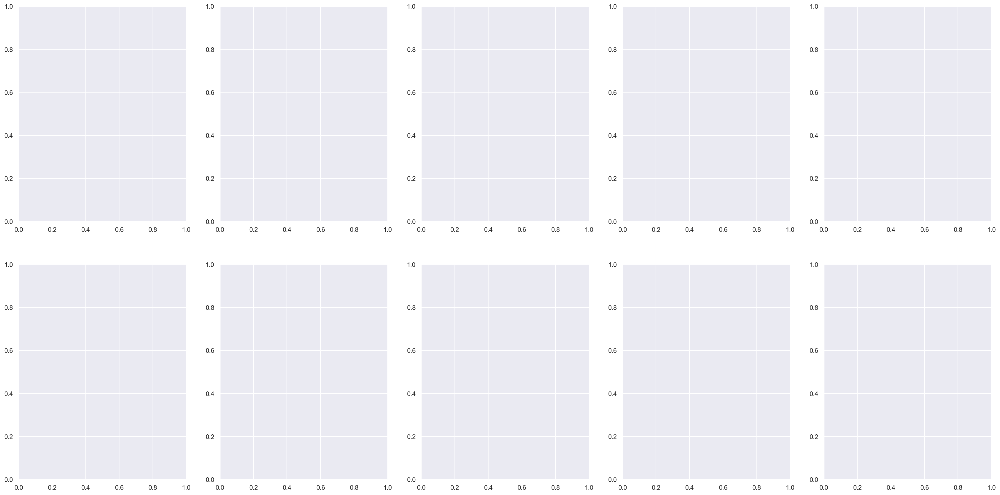

In [541]:
# Prepare figure. Create individual axes where each bar plot will be placed
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(30, 15))
# Plot data
# Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
for ax, feat in zip(axes.flatten(), metric_features): # Notice the zip() function and flatten() method
    sns.histplot(df_filter1[feat], ax=ax)
    #ax.set_title(feat, y=-0.15)
plt.show()

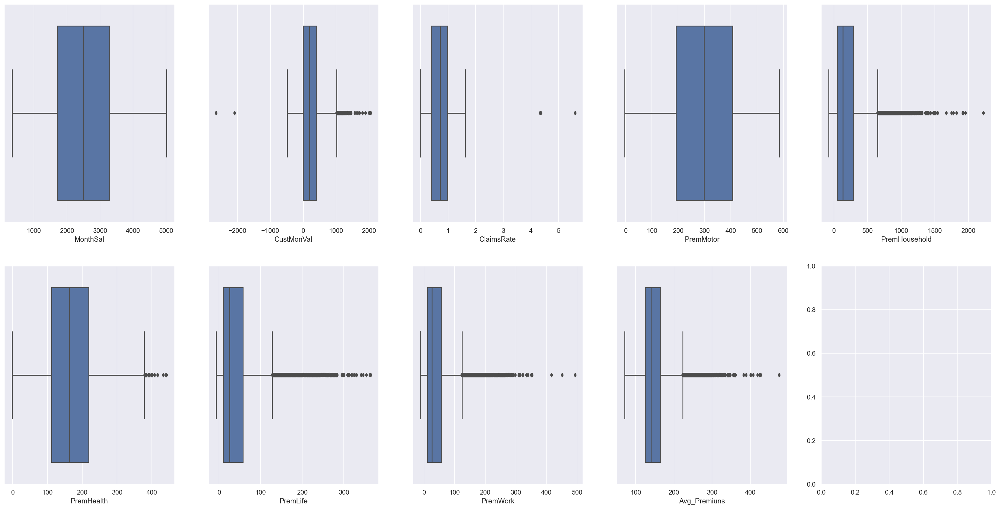

In [542]:
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(30, 15))
# Plot data
# Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
for ax, feat in zip(axes.flatten(), metric_features): # Notice the zip() function and flatten() method
    sns.boxplot(data=df_filter1, x=feat, ax=ax)
    #ax.set_title(feat, y=-0.15)
plt.show()

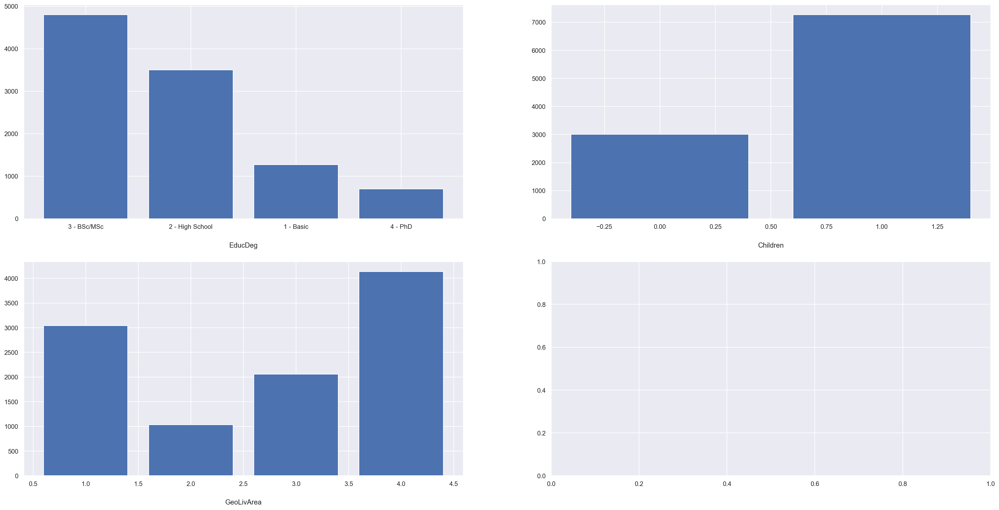

In [543]:
# Prepare figure. Create individual axes where each bar plot will be placed
fig, axes = plt.subplots(2, ceil(len(non_metric_features) / 2), figsize=(30, 15))

# Plot data
# Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
for ax, feat in zip(axes.flatten(), non_metric_features): # Notice the zip() function and flatten() method
    ax.bar(height=list(df_filter1[feat].value_counts()), x=list(df[feat].value_counts().index))
    ax.set_title(feat, y=-0.15)
plt.show()

In [544]:
# removing outliers using a threshold by observing the histogram and box plot
filters1 = (
    (df_filter1['MonthSal']<=5000)
    &
    (df_filter1['CustMonVal']<=1500)
    &
    (df_filter1['CustMonVal'] >= -1000)
    &
    (df_filter1['ClaimsRate']<=30)
    &
    (df_filter1['PremMotor']<=700)
    &
    (df_filter1['PremHousehold']<=1250)
    &
    (df_filter1['PremHealth']<=400)
    &
    (df_filter1['PremLife']<=270)
    &
    (df_filter1['PremWork']<=350)
        
)

df_filter = df_filter1[filters1]

In [545]:
print('Percentage of data kept after removing outliers:', np.round(df_filter.shape[0] / df.shape[0], 4)*100)

Percentage of data kept after removing outliers: 98.9


<hr>
<a class="anchor" id="removingoutliers3">
    
# 5.4. Removing Outliers with IQR
    
</a>

In [546]:
q25 = df.quantile(.25)
q75 = df.quantile(.75)
iqr = (q75 - q25)

upper_lim = q75 + 1.5 * iqr
lower_lim = q25 - 1.5 * iqr

filters = []
for metric in metric_features:
    llim = lower_lim[metric]
    ulim = upper_lim[metric]
    filters.append(df[metric].between(llim, ulim, inclusive=True))

df_iqr = df[np.all(filters, 0)]


In [547]:
print('Percentage of data kept after removing outliers:', np.round(df_iqr.shape[0] / df.shape[0], 4))

Percentage of data kept after removing outliers: 0.8537


<hr>
<a class="anchor" id="removingoutliers4">
    
# 5.5. Removing Outliers with Z-score
    
</a>

In [548]:
#calculation of the absolute z-score for every metric feature
z_score_abs = np.abs(stats.zscore(df[metric_features]))

In [549]:
z_score_abs

,MonthSal,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns
CustID,,,,,,,,,
1.0,0.285319,0.104371,0.120944,0.356343,0.371495,0.085147,0.112530,0.472709,0.211570
2.0,1.583607,0.158822,0.129328,1.054121,0.583611,0.185461,3.232531,1.266349,0.309092
3.0,0.198767,0.167947,0.158656,0.445815,0.039903,0.158785,0.944840,1.127793,0.052359
4.0,1.218355,0.100160,0.084759,0.557701,0.473883,0.472072,0.134371,0.249578,0.349225
5.0,0.643647,0.073321,0.053904,0.180360,0.461262,0.037346,0.484729,0.005902,0.288629
...,...,...,...,...,...,...,...,...,...
10292.0,0.589726,0.091484,0.074474,0.440907,0.456582,0.007661,0.675140,0.513828,0.262490
10293.0,0.065476,0.630979,0.254651,0.788847,2.340806,0.095662,0.609342,1.246861,1.411603
10294.0,0.356035,0.177933,0.182655,0.487656,0.220181,0.099043,0.613997,0.706559,0.146476


In [550]:
# we mantain only observations with a z-score inferior to 3.5
df_zscore = df[(z_score_abs < 3.5).all(axis = 1)]

In [551]:
df_zscore.shape

(10033, 12)

In [552]:
# we remove 2.55% of the observations 
print('Percentage of data kept after removing outliers:', np.round(df_zscore.shape[0] / df.shape[0], 4)*100)

Percentage of data kept after removing outliers: 97.45


<hr>
<a class="anchor" id="removingoutliers5">
    
# 5.6. Removing Outliers with LOF
    
</a>

In [553]:
# We use LocalOutlierFactor
local_outlier_factor = LocalOutlierFactor(n_neighbors=200) # is 200 neighbors to much????

In [554]:
lof_prediction = local_outlier_factor.fit_predict(df[metric_features])

In [555]:
df_lof = df[lof_prediction !=-1]

In [556]:
print('Percentage of data kept after removing outliers:', np.round(df_lof.shape[0] / df.shape[0], 4)*100)

Percentage of data kept after removing outliers: 98.36


<hr>
<a class="anchor" id="removingoutliers6">
    
# 5.7. Removing Outliers with OneClassSVM
    
</a>

In [557]:
one_class_svm = OneClassSVM(nu = 0.025)

In [558]:
svm_predict = one_class_svm.fit_predict(df[metric_features])

In [559]:
df_svm = df[svm_predict != -1]

In [560]:
print('Percentage of data kept after removing outliers:', np.round(df_svm.shape[0] / df.shape[0], 4)*100)

Percentage of data kept after removing outliers: 97.5


<hr>
<a class="anchor" id="removingoutliers7">
    
# 5.8. Removing Outliers with DBSCAN
    
</a>

In [561]:
scaler = MinMaxScaler()
scaled_feat = scaler.fit_transform(df[metric_features])
df[metric_features] = scaled_feat

In [562]:
dbscan = DBSCAN(eps=0.1, min_samples=100, n_jobs=4)
dbscan_labels = dbscan.fit_predict(df[metric_features])

dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)

Number of estimated clusters : 2


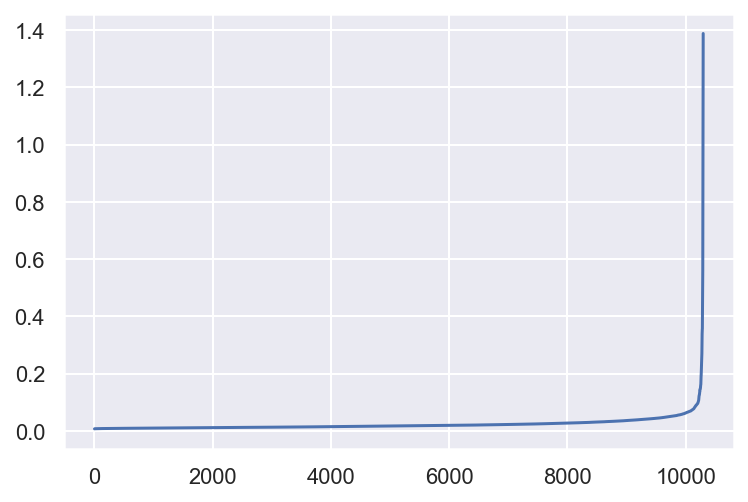

In [563]:
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=100)
neigh.fit(df[metric_features])
distances, _ = neigh.kneighbors(df[metric_features])
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.show()

In [564]:
# Concatenating the labels to df
df_concat = pd.concat([df[metric_features], pd.Series(dbscan_labels, index=df.index, name="dbscan_labels")], axis=1)
df_concat.head()

,MonthSal,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns,dbscan_labels
CustID,,,,,,,,,,
1.0,0.033599,0.935260,0.001522,0.032731,0.006148,0.005251,0.133259,0.014440,0.010746,0
2.0,0.006268,0.932376,0.004372,0.007027,0.019551,0.004202,0.497113,0.059044,0.019214,0
3.0,0.035421,0.935957,0.001093,0.018113,0.011921,0.004481,0.230323,0.055491,0.013335,0
4.0,0.013957,0.933019,0.003864,0.016074,0.004711,0.011080,0.104466,0.020163,0.008507,0
5.0,0.026056,0.933313,0.003513,0.029524,0.004888,0.006532,0.063607,0.026716,0.009492,0


In [565]:
# Detecting noise (potential outliers)
df_concat.loc[df_concat['dbscan_labels'] == -1].shape

(40, 10)

In [566]:
df_dbscan = df_concat.loc[df_concat['dbscan_labels'] != -1]

In [567]:
print('Percentage of data kept after removing outliers:', np.round(df_dbscan.shape[0] / df.shape[0], 4)*100)

Percentage of data kept after removing outliers: 99.61


<hr>
<a class="anchor" id="relandredun">
    
# 6. Relavancy and Redundancy 
    
</a>

<hr>
<a class="anchor" id="relbetvars">
    
# 6.1. Relation Between Variables 
    
</a>

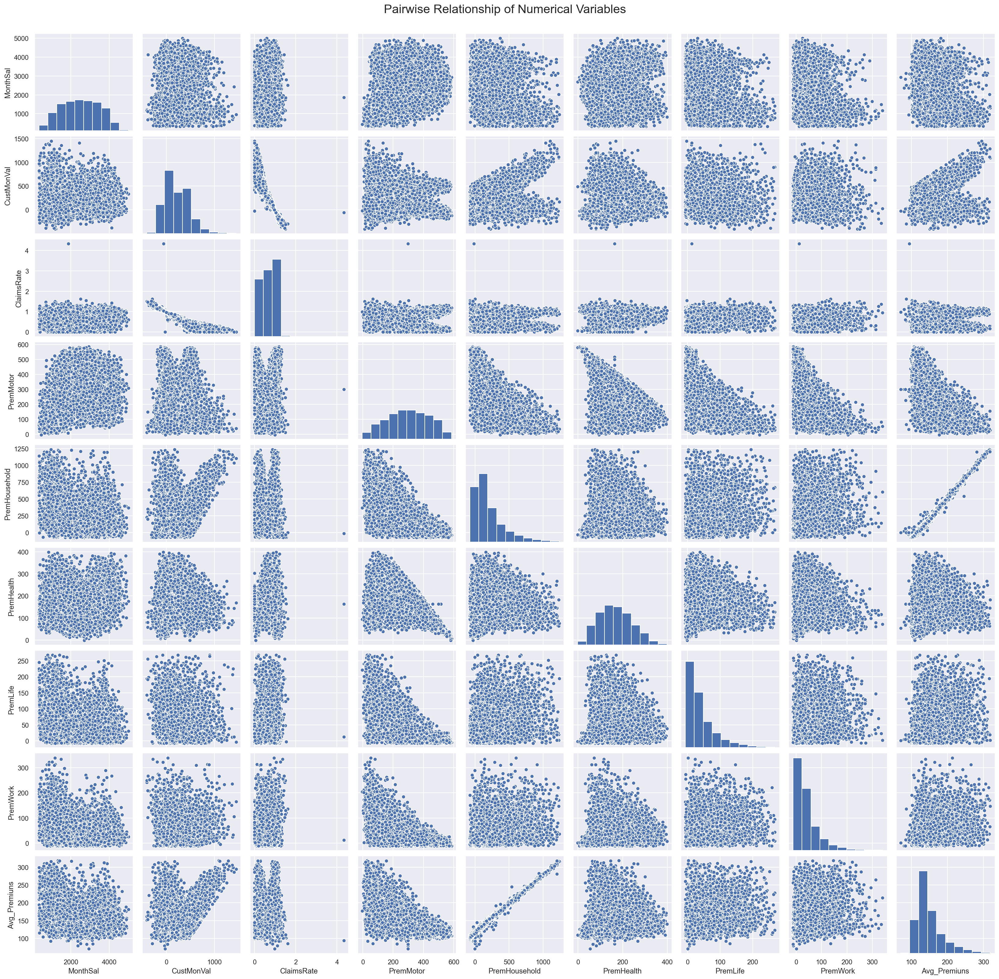

In [568]:
# Pairwise Relationship of Numerical Variables after the outlier removal
sns.set()

# Setting pairplot
sns.pairplot(df_filter[metric_features], diag_kind="hist")

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=20)

plt.show()

<hr>
<a class="anchor" id="correlation">
    
# 6.2. Correlation 
    
</a>

In [570]:
def cor_heatmap(cor):
    plt.figure(figsize=(12,10))
    sns.heatmap(data = cor, annot = True, cmap = plt.cm.Blues, fmt='.1')
    plt.show()


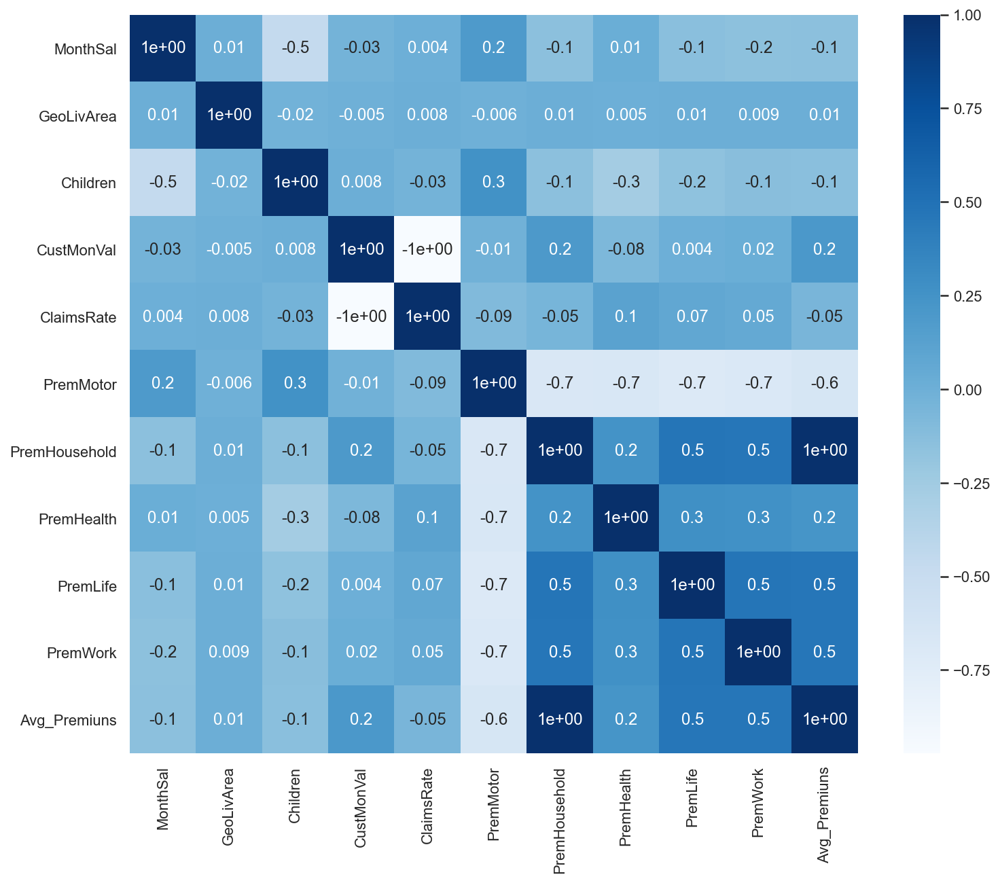

In [571]:
# we use spearman because doesn`t seem to exist any linear relation between variables
cor_heatmap(df_filter.corr(method ='spearman'))


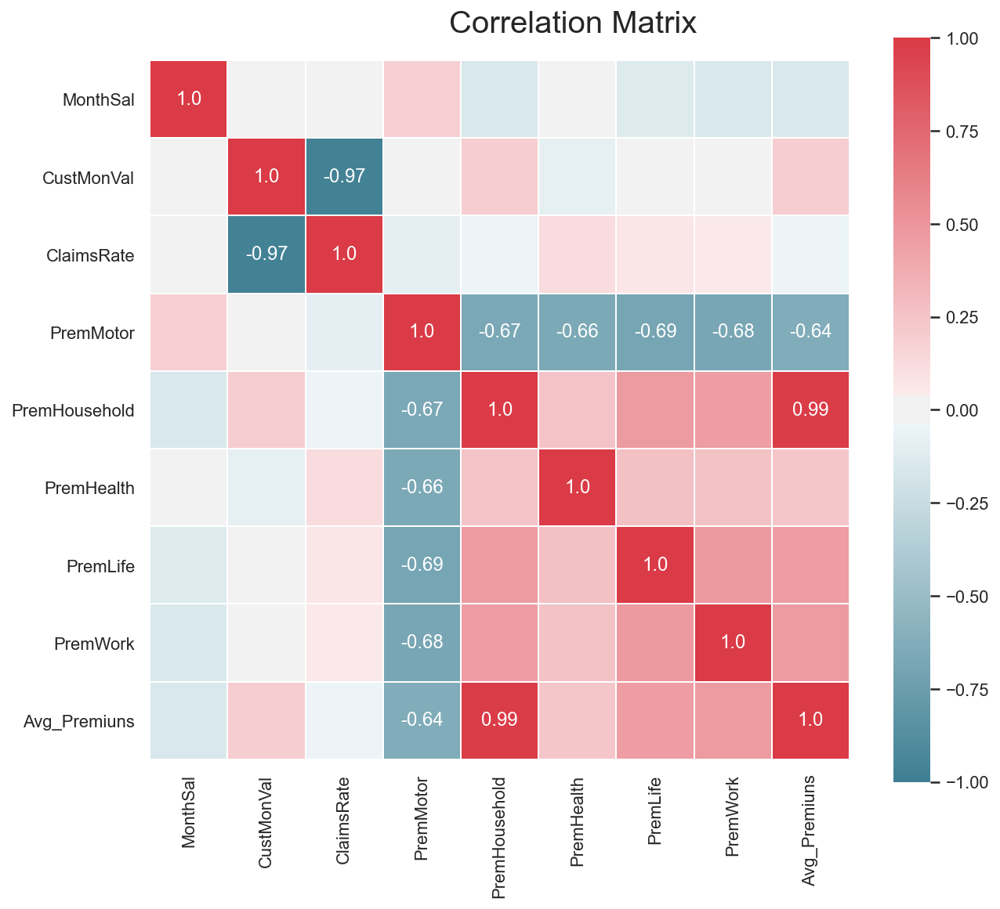

In [572]:
# Prepare figure
fig = plt.figure(figsize=(10, 8))

# Obtain correlation matrix. Round the values to 2 decimal cases. Use the DataFrame corr() and round() method.
corr = np.round(df_filter[metric_features].corr(method="spearman"), decimals=2)

# Build annotation matrix (values above |0.5| will appear annotated in the plot)
mask_annot = np.absolute(corr.values) >= 0.5
annot = np.where(mask_annot, corr.values, np.full(corr.shape,"")) # Try to understand what this np.where() does

# Plot heatmap of the correlation matrix
sns.heatmap(data=corr, annot=annot, cmap=sns.diverging_palette(220, 10, as_cmap=True), 
            fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

# Layout
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

In [573]:
# variable premhousehold probably the greatest value in the mean spend in premiuns therefor the big correlation
# custmonval and claimsrate are highly corrolated

In [574]:
df_filter.drop(columns = 'GeoLivArea', inplace = True)

In [576]:
# df_filter.drop(columns = 'CustMonVal', inplace = True)

In [577]:
non_metric_features.remove('GeoLivArea')
# metric_features.remove('CustMonVal')

In [578]:
df_filter.head(3)

,EducDeg,MonthSal,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns
CustID,,,,,,,,,,,
1.0,b'2 - High School',2177.0,1.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89,133.112
2.0,b'2 - High School',677.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13,182.192
3.0,b'1 - Basic',2277.0,0.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02,148.120


<hr>
<a class="anchor" id="normalization">
    
# 7. Normalization 
    
</a>

In [579]:
df_minmax = df_filter.copy()

In [580]:
# Use MinMaxScaler to scale the data
scaler = MinMaxScaler()
scaled_feat = scaler.fit_transform(df_minmax[metric_features])

In [581]:
df_minmax[metric_features] = scaled_feat
df_minmax.head()

,EducDeg,MonthSal,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns
CustID,,,,,,,,,,,
1.0,b'2 - High School',0.395538,1.0,0.424429,0.090069,0.644732,0.117631,0.370693,0.196443,0.082111,0.251630
2.0,b'2 - High School',0.073788,1.0,0.148268,0.258661,0.138411,0.374105,0.296614,0.732814,0.335749,0.449941
3.0,b'1 - Basic',0.416988,0.0,0.491137,0.064665,0.356778,0.228104,0.316314,0.339529,0.315541,0.312271
4.0,b'3 - BSc/MSc',0.164307,1.0,0.209820,0.228637,0.316614,0.090137,0.782183,0.153997,0.114654,0.199200
5.0,b'3 - BSc/MSc',0.306735,1.0,0.237981,0.207852,0.581559,0.093526,0.461151,0.093766,0.151916,0.222280


In [582]:
# Checking max and min of minmaxed variables
df_minmax[metric_features].describe().round(2)

,MonthSal,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns
count,10183.00,10183.00,10183.00,10183.00,10183.00,10183.00,10183.00,10183.00,10183.00
mean,0.47,0.34,0.16,0.51,0.21,0.43,0.17,0.15,0.32
std,0.21,0.14,0.07,0.23,0.17,0.18,0.16,0.13,0.15
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.30,0.21,0.09,0.34,0.09,0.28,0.06,0.06,0.22
50%,0.47,0.32,0.17,0.51,0.16,0.41,0.12,0.11,0.28
75%,0.63,0.43,0.23,0.70,0.27,0.55,0.23,0.19,0.38
max,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00


In [583]:
df_standard = df.copy()

In [584]:
scaler = StandardScaler()
scaled_feat = scaler.fit_transform(df_standard[metric_features])

In [585]:
df_standard[metric_features] = scaled_feat
df_standard.head()

,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns
CustID,,,,,,,,,,,,
1.0,b'2 - High School',-0.285319,1.0,1.0,0.104371,-0.120944,0.356343,-0.371495,-0.085147,0.112530,-0.472709,-0.211570
2.0,b'2 - High School',-1.583607,4.0,1.0,-0.158822,0.129328,-1.054121,0.583611,-0.185461,3.232531,1.266349,0.309092
3.0,b'1 - Basic',-0.198767,3.0,0.0,0.167947,-0.158656,-0.445815,0.039903,-0.158785,0.944840,1.127793,-0.052359
4.0,b'3 - BSc/MSc',-1.218355,4.0,1.0,-0.100160,0.084759,-0.557701,-0.473883,0.472072,-0.134371,-0.249578,-0.349225
5.0,b'3 - BSc/MSc',-0.643647,4.0,1.0,-0.073321,0.053904,0.180360,-0.461262,0.037346,-0.484729,0.005902,-0.288629


In [586]:
# Checking mean and variance of standardized variables
df_standard[metric_features].describe().round(2)

,MonthSal,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns
count,10296.00,10296.00,10296.00,10296.00,10296.00,10296.00,10296.00,10296.00,10296.00
mean,-0.00,-0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,0.00
std,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
min,-1.88,-85.24,-0.25,-1.44,-0.81,-0.59,-1.03,-1.04,-0.87
25%,-0.69,-0.10,-0.12,-0.52,-0.46,-0.20,-0.67,-0.59,-0.29
50%,-0.00,0.00,-0.01,-0.01,-0.22,-0.03,-0.34,-0.30,-0.14
75%,0.68,0.11,0.08,0.51,0.23,0.16,0.32,0.29,0.13
max,45.62,6.01,87.58,53.43,70.45,95.01,7.54,37.95,60.61


In [587]:
df_final = df_standard.copy()

<hr>
<a class="anchor" id="ohc">
    
# 8. One Hot Encodindg 
    
</a>

In [588]:
df_ohc = df_final.copy()

In [589]:
# Use OneHotEncoder to encode the categorical features. Get feature names and create a DataFrame 
# with the one-hot encoded categorical features (pass feature names)
ohc = OneHotEncoder(sparse=False, drop = 'first')
ohc_feat = ohc.fit_transform(df_ohc[non_metric_features])
ohc_feat_names = ohc.get_feature_names()
ohc_df = pd.DataFrame(ohc_feat, index=df_ohc.index, columns=ohc_feat_names)  # Why the index=df_ohc.index?
ohc_df.head(15)

,x0_b'2 - High School',x0_b'3 - BSc/MSc',x0_b'4 - PhD',x1_1.0
CustID,,,,
1.0,1.0,0.0,0.0,1.0
2.0,1.0,0.0,0.0,1.0
3.0,0.0,0.0,0.0,0.0
4.0,0.0,1.0,0.0,1.0
5.0,0.0,1.0,0.0,1.0
6.0,1.0,0.0,0.0,1.0
7.0,1.0,0.0,0.0,0.0
8.0,1.0,0.0,0.0,1.0
9.0,0.0,1.0,0.0,1.0


In [590]:
# Reassigning df to contain ohc variables
df_ohc = pd.concat([df_ohc.drop(columns=non_metric_features), ohc_df], axis=1)
df_ohc.head()

,MonthSal,GeoLivArea,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns,x0_b'2 - High School',x0_b'3 - BSc/MSc',x0_b'4 - PhD',x1_1.0
CustID,,,,,,,,,,,,,,
1.0,-0.285319,1.0,0.104371,-0.120944,0.356343,-0.371495,-0.085147,0.112530,-0.472709,-0.211570,1.0,0.0,0.0,1.0
2.0,-1.583607,4.0,-0.158822,0.129328,-1.054121,0.583611,-0.185461,3.232531,1.266349,0.309092,1.0,0.0,0.0,1.0
3.0,-0.198767,3.0,0.167947,-0.158656,-0.445815,0.039903,-0.158785,0.944840,1.127793,-0.052359,0.0,0.0,0.0,0.0
4.0,-1.218355,4.0,-0.100160,0.084759,-0.557701,-0.473883,0.472072,-0.134371,-0.249578,-0.349225,0.0,1.0,0.0,1.0
5.0,-0.643647,4.0,-0.073321,0.053904,0.180360,-0.461262,0.037346,-0.484729,0.005902,-0.288629,0.0,1.0,0.0,1.0


In [591]:
df_final = df_ohc.copy()

<hr>
<a class="anchor" id="pca">
    
# 9. PCA 
    
</a>

In [592]:
df_pca = df_final.copy()

In [593]:
# Use PCA to reduce dimensionality of data
pca = PCA()
pca_feat = pca.fit_transform(df_pca[metric_features])

In [594]:
# Output PCA table
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)

,Eigenvalue,Difference,Proportion,Cumulative
1,2.344907e+00,0.000000,2.605199e-01,0.260520
2,1.993386e+00,-0.351521,2.214658e-01,0.481986
3,1.552450e+00,-0.440936,1.724777e-01,0.654463
4,9.257651e-01,-0.626685,1.028528e-01,0.757316
5,8.935867e-01,-0.032178,9.927776e-02,0.856594
6,6.750693e-01,-0.218517,7.500042e-02,0.931594
7,6.097367e-01,-0.065333,6.774194e-02,0.999336
8,5.973325e-03,-0.603763,6.636383e-04,1.000000
9,2.412541e-30,-0.005973,2.680340e-31,1.000000


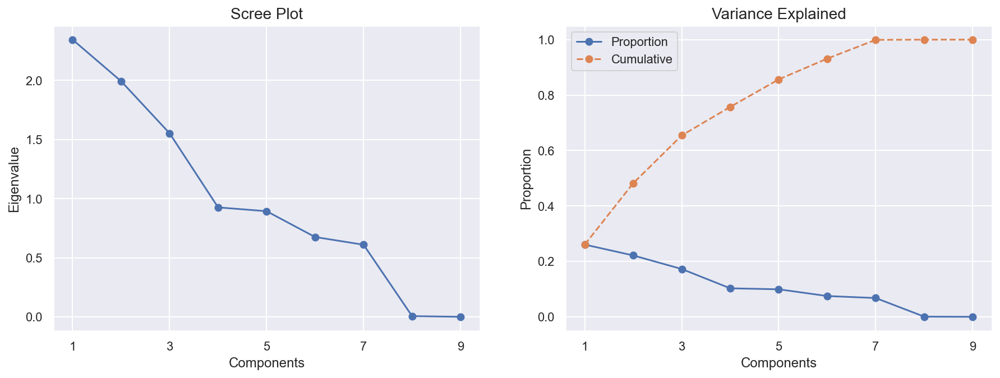

In [595]:
# figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

plt.show()

In [596]:
# Perform PCA again with the number of principal components you want to retain
pca = PCA(n_components=4) # 5 may be better???????
pca_feat = pca.fit_transform(df_pca[metric_features])
pca_feat_names = [f"PC{i}" for i in range(pca.n_components_)]
pca_df = pd.DataFrame(pca_feat, index=df_pca.index, columns=pca_feat_names)  # remember index=df_pca.index
pca_df

,PC0,PC1,PC2,PC3
CustID,,,,
1.0,-0.484585,-0.199524,-0.013925,-0.255295
2.0,2.785781,0.556176,-2.185314,-0.333650
3.0,0.959670,-0.097706,-1.004922,0.282313
4.0,0.012824,0.188902,-0.421636,-0.130315
5.0,-0.463276,0.061569,-0.067736,-0.283382
...,...,...,...,...
10292.0,-1.083993,0.000261,0.536520,0.233935
10293.0,2.353742,-0.491181,0.427723,-0.704073
10294.0,-0.928935,-0.367532,0.550259,-0.109898


In [597]:
# Reassigning df to contain pca variables
df_pca = pd.concat([df_pca, pca_df], axis=1)
df_pca.head()

,MonthSal,GeoLivArea,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns,x0_b'2 - High School',x0_b'3 - BSc/MSc',x0_b'4 - PhD',x1_1.0,PC0,PC1,PC2,PC3
CustID,,,,,,,,,,,,,,,,,,
1.0,-0.285319,1.0,0.104371,-0.120944,0.356343,-0.371495,-0.085147,0.112530,-0.472709,-0.211570,1.0,0.0,0.0,1.0,-0.484585,-0.199524,-0.013925,-0.255295
2.0,-1.583607,4.0,-0.158822,0.129328,-1.054121,0.583611,-0.185461,3.232531,1.266349,0.309092,1.0,0.0,0.0,1.0,2.785781,0.556176,-2.185314,-0.333650
3.0,-0.198767,3.0,0.167947,-0.158656,-0.445815,0.039903,-0.158785,0.944840,1.127793,-0.052359,0.0,0.0,0.0,0.0,0.959670,-0.097706,-1.004922,0.282313
4.0,-1.218355,4.0,-0.100160,0.084759,-0.557701,-0.473883,0.472072,-0.134371,-0.249578,-0.349225,0.0,1.0,0.0,1.0,0.012824,0.188902,-0.421636,-0.130315
5.0,-0.643647,4.0,-0.073321,0.053904,0.180360,-0.461262,0.037346,-0.484729,0.005902,-0.288629,0.0,1.0,0.0,1.0,-0.463276,0.061569,-0.067736,-0.283382


In [598]:
def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: red'
    elif val > 0.45:
        color = 'background-color: green'
    else:
        color = ''
    return color

# Interpreting each Principal Component
loadings = df_pca[metric_features + pca_feat_names].corr().loc[metric_features, pca_feat_names]
loadings.style.applymap(_color_red_or_green)

,PC0,PC1,PC2,PC3
MonthSal,-0.329976,-0.043217,0.276214,0.590590
CustMonVal,0.100895,-0.992450,-0.041825,0.004866
ClaimsRate,-0.076533,0.992621,0.064908,-0.026359
PremMotor,-0.482659,-0.105733,0.587312,-0.369578
PremHousehold,0.743340,0.029833,0.137711,-0.380866
PremHealth,0.429469,0.022394,0.600053,0.486840
PremLife,0.594410,0.071834,-0.443960,0.107572
PremWork,0.598471,0.057736,-0.331658,0.180971
Avg_Premiuns,0.733696,0.002401,0.662556,-0.114797


In [ ]:
# custmonval or claimsrate may need to be eliminated from the dataframe

In [599]:
df_final = df_pca.copy()

In [600]:
df_final.head()

,MonthSal,GeoLivArea,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns,x0_b'2 - High School',x0_b'3 - BSc/MSc',x0_b'4 - PhD',x1_1.0,PC0,PC1,PC2,PC3
CustID,,,,,,,,,,,,,,,,,,
1.0,-0.285319,1.0,0.104371,-0.120944,0.356343,-0.371495,-0.085147,0.112530,-0.472709,-0.211570,1.0,0.0,0.0,1.0,-0.484585,-0.199524,-0.013925,-0.255295
2.0,-1.583607,4.0,-0.158822,0.129328,-1.054121,0.583611,-0.185461,3.232531,1.266349,0.309092,1.0,0.0,0.0,1.0,2.785781,0.556176,-2.185314,-0.333650
3.0,-0.198767,3.0,0.167947,-0.158656,-0.445815,0.039903,-0.158785,0.944840,1.127793,-0.052359,0.0,0.0,0.0,0.0,0.959670,-0.097706,-1.004922,0.282313
4.0,-1.218355,4.0,-0.100160,0.084759,-0.557701,-0.473883,0.472072,-0.134371,-0.249578,-0.349225,0.0,1.0,0.0,1.0,0.012824,0.188902,-0.421636,-0.130315
5.0,-0.643647,4.0,-0.073321,0.053904,0.180360,-0.461262,0.037346,-0.484729,0.005902,-0.288629,0.0,1.0,0.0,1.0,-0.463276,0.061569,-0.067736,-0.283382


<hr>
<a class="anchor" id="clustering">
    
# 10. Clustering 
    
</a>

<hr>
<a class="anchor" id="hc">
    
# 10.1. Hierarchical Clustering
    
</a>

In [601]:
# voltar a fazer esta parte e pôr
df = df_final.copy()

In [602]:
# Splitting feature names into groups
non_metric_features = df.columns[df.columns.str.startswith('x')]
pc_features = df.columns[df.columns.str.startswith('PC')]
metric_features = df.columns[~df.columns.str.startswith('x') & ~df.columns.str.startswith('PC')]

In [603]:
# Performing HC
hclust = AgglomerativeClustering(linkage='ward', affinity='euclidean', n_clusters=5)
hc_labels = hclust.fit_predict(df[metric_features])

In [604]:
# Characterizing the clusters
df_concat = pd.concat((df, pd.Series(hc_labels, name='labels')), axis=1)
df_concat.groupby('labels').mean()

,MonthSal,GeoLivArea,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns,x0_b'2 - High School',x0_b'3 - BSc/MSc',x0_b'4 - PhD',x1_1.0,PC0,PC1,PC2,PC3
labels,,,,,,,,,,,,,,,,,,
0.0,-0.006170,2.745078,-0.000013,-0.000656,0.013550,0.004218,-0.018630,-0.030265,-0.029075,-0.008654,0.331146,0.477032,0.073195,0.720343,-0.033346,-0.004228,0.010402,-0.027891
1.0,-0.000687,2.707809,-0.000760,0.001707,-0.005531,0.004961,-0.009680,0.007193,0.008753,-0.003171,0.349250,0.463368,0.065678,0.699707,0.006143,0.002839,-0.013338,-0.002380
2.0,0.507501,4.000000,-0.003234,-0.011235,0.189813,-0.209120,-0.065605,-0.280142,-0.188972,-0.161074,0.000000,1.000000,0.000000,1.000000,-0.548551,-0.063092,0.211271,0.240842
3.0,1.219829,4.000000,0.142866,-0.117516,-0.556661,0.181715,0.139924,-0.381271,1.279405,0.074942,0.000000,0.000000,0.000000,0.000000,0.443290,-0.139595,-0.080278,1.154503
4.0,0.005661,2.686579,0.001652,-0.003310,0.002020,-0.014647,0.037071,0.007817,0.002501,0.014269,0.329749,0.470729,0.068100,0.714855,0.012553,-0.003010,0.022352,0.026996


In [605]:
# Computing SST
X = df[metric_features].values
sst = np.sum(np.square(X - X.mean(axis=0)), axis=0)

# Computing SSW
ssw_iter = []
for i in np.unique(hc_labels):
    X_k = X[hc_labels == i]
    ssw_iter.append(np.sum(np.square(X_k - X_k.mean(axis=0)), axis=0))
ssw = np.sum(ssw_iter, axis=0)

# Computing SSB
ssb_iter = []
for i in np.unique(hc_labels):
    X_k = X[hc_labels == i]
    ssb_iter.append(X_k.shape[0] * np.square(X_k.mean(axis=0) - X.mean(axis=0)))
ssb = np.sum(ssb_iter, axis=0)

# Verifying the formula
np.round(sst) == np.round((ssw + ssb))

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True])

In [606]:
def get_r2_hc(df, link_method, max_nclus, min_nclus=1, dist="euclidean"):
    """This function computes the R2 for a set of cluster solutions given by the application of a hierarchical method.
    The R2 is a measure of the homogenity of a cluster solution. It is based on SSt = SSw + SSb and R2 = SSb/SSt. 
    
    Parameters:
    df (DataFrame): Dataset to apply clustering
    link_method (str): either "ward", "complete", "average", "single"
    max_nclus (int): maximum number of clusters to compare the methods
    min_nclus (int): minimum number of clusters to compare the methods. Defaults to 1.
    dist (str): distance to use to compute the clustering solution. Must be a valid distance. Defaults to "euclidean".
    
    Returns:
    ndarray: R2 values for the range of cluster solutions
    """
    def get_ss(df):
        ss = np.sum(df.var() * (df.count() - 1))
        return ss  # return sum of sum of squares of each df variable
    
    sst = get_ss(df)  # get total sum of squares
    
    r2 = []  # where we will store the R2 metrics for each cluster solution
    
    for i in range(min_nclus, max_nclus+1):  # iterate over desired ncluster range
        cluster = AgglomerativeClustering(n_clusters=i, affinity=dist, linkage=link_method)
        
        
        hclabels = cluster.fit_predict(df) #get cluster labels
        
        
        df_concat = pd.concat((df, pd.Series(hclabels, name='labels')), axis=1)  # concat df with labels
        
        
        ssw_labels = df_concat.groupby(by='labels').apply(get_ss)  # compute ssw for each cluster labels
        
        
        ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
        
        
        r2.append(ssb / sst)  # save the R2 of the given cluster solution
        
    return np.array(r2)

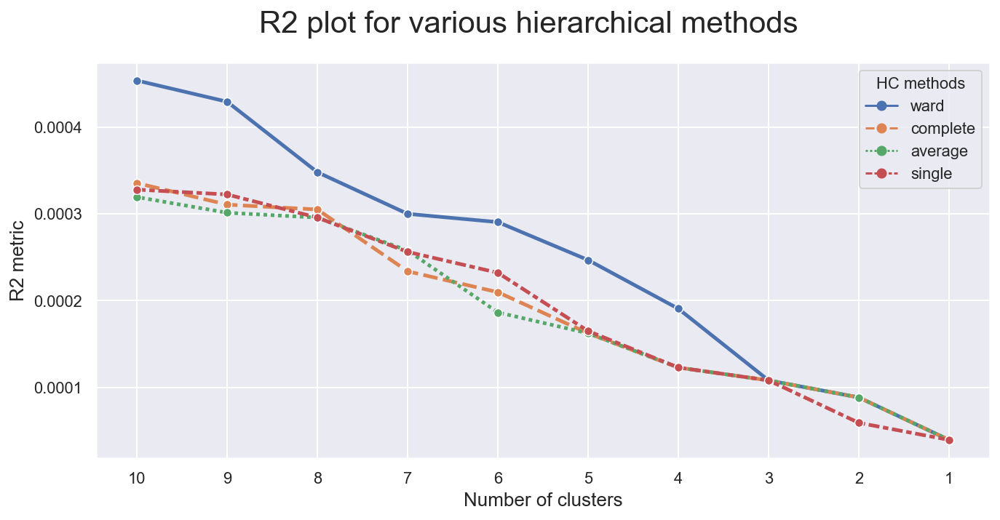

In [607]:
# Prepare input
hc_methods = ["ward", "complete", "average", "single"]
# Call function defined above to obtain the R2 statistic for each hc_method
max_nclus = 10
r2_hc_methods = np.vstack(
    [
        get_r2_hc(df=df[metric_features], link_method=link, max_nclus=max_nclus) 
        for link in hc_methods
    ]
).T
r2_hc_methods = pd.DataFrame(r2_hc_methods, index=range(1, max_nclus + 1), columns=hc_methods)

sns.set()
# Plot data
fig = plt.figure(figsize=(11,5))
sns.lineplot(data=r2_hc_methods, linewidth=2.5, markers=["o"]*4)

# Finalize the plot
fig.suptitle("R2 plot for various hierarchical methods", fontsize=21)
plt.gca().invert_xaxis()  # invert x axis
plt.legend(title="HC methods", title_fontsize=11)
plt.xticks(range(1, max_nclus + 1))
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)

plt.show()

### Defining the number of Clusters

In [608]:
# setting distance_threshold=0 and n_clusters=None ensures we compute the full tree
linkage = 'ward'
distance = 'euclidean'
hclust = AgglomerativeClustering(linkage=linkage, affinity=distance, distance_threshold=0, n_clusters=None)
hclust.fit_predict(df[metric_features])

array([8239, 5478, 7092, ...,    4,    1,    0], dtype=int64)

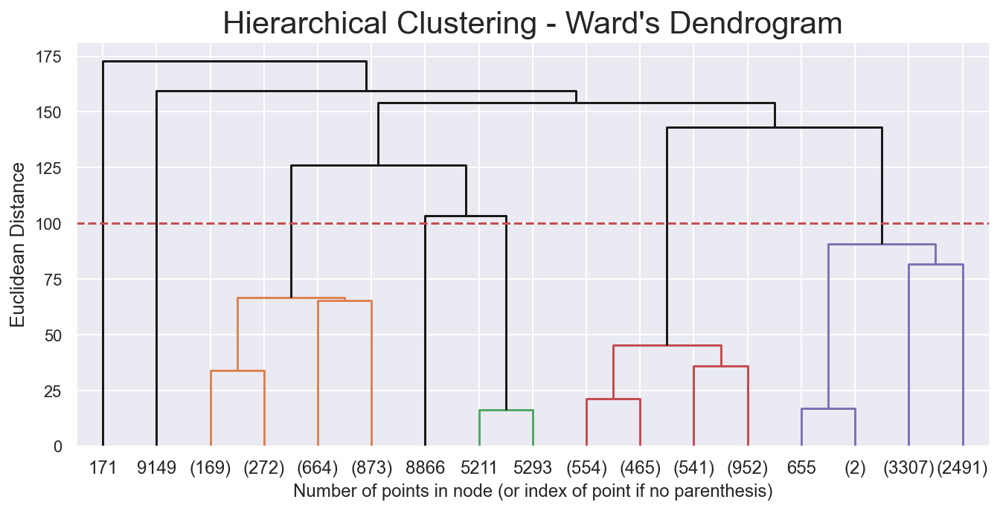

In [609]:
# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 100
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()

### Solution

In [610]:
# 4 cluster solution
linkage = 'ward'
distance = 'euclidean'
hc4lust = AgglomerativeClustering(linkage=linkage, affinity=distance, n_clusters=4)
hc4_labels = hc4lust.fit_predict(df[metric_features])

In [611]:
# Characterizing the 4 clusters
df_concat = pd.concat((df, pd.Series(hc4_labels, name='labels')), axis=1)
df_concat.groupby('labels').mean()

,MonthSal,GeoLivArea,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns,x0_b'2 - High School',x0_b'3 - BSc/MSc',x0_b'4 - PhD',x1_1.0,PC0,PC1,PC2,PC3
labels,,,,,,,,,,,,,,,,,,
0.0,0.001231,2.701396,-0.000031,0.000191,-0.003250,-0.000962,0.004443,0.007381,0.006865,0.002097,0.343359,0.465592,0.066410,0.704283,0.008080,0.001072,-0.002557,0.006494
1.0,-0.006170,2.745078,-0.000013,-0.000656,0.013550,0.004218,-0.018630,-0.030265,-0.029075,-0.008654,0.331146,0.477032,0.073195,0.720343,-0.033346,-0.004228,0.010402,-0.027891
2.0,0.507501,4.000000,-0.003234,-0.011235,0.189813,-0.209120,-0.065605,-0.280142,-0.188972,-0.161074,0.000000,1.000000,0.000000,1.000000,-0.548551,-0.063092,0.211271,0.240842
3.0,1.219829,4.000000,0.142866,-0.117516,-0.556661,0.181715,0.139924,-0.381271,1.279405,0.074942,0.000000,0.000000,0.000000,0.000000,0.443290,-0.139595,-0.080278,1.154503


In [612]:
# 5 cluster solution
linkage = 'ward'
distance = 'euclidean'
hc5lust = AgglomerativeClustering(linkage=linkage, affinity=distance, n_clusters=5)
hc5_labels = hc5lust.fit_predict(df[metric_features])

In [613]:
# Characterizing the 5 clusters
df_concat = pd.concat((df, pd.Series(hc5_labels, name='labels')), axis=1)
df_concat.groupby('labels').mean()

,MonthSal,GeoLivArea,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns,x0_b'2 - High School',x0_b'3 - BSc/MSc',x0_b'4 - PhD',x1_1.0,PC0,PC1,PC2,PC3
labels,,,,,,,,,,,,,,,,,,
0.0,-0.006170,2.745078,-0.000013,-0.000656,0.013550,0.004218,-0.018630,-0.030265,-0.029075,-0.008654,0.331146,0.477032,0.073195,0.720343,-0.033346,-0.004228,0.010402,-0.027891
1.0,-0.000687,2.707809,-0.000760,0.001707,-0.005531,0.004961,-0.009680,0.007193,0.008753,-0.003171,0.349250,0.463368,0.065678,0.699707,0.006143,0.002839,-0.013338,-0.002380
2.0,0.507501,4.000000,-0.003234,-0.011235,0.189813,-0.209120,-0.065605,-0.280142,-0.188972,-0.161074,0.000000,1.000000,0.000000,1.000000,-0.548551,-0.063092,0.211271,0.240842
3.0,1.219829,4.000000,0.142866,-0.117516,-0.556661,0.181715,0.139924,-0.381271,1.279405,0.074942,0.000000,0.000000,0.000000,0.000000,0.443290,-0.139595,-0.080278,1.154503
4.0,0.005661,2.686579,0.001652,-0.003310,0.002020,-0.014647,0.037071,0.007817,0.002501,0.014269,0.329749,0.470729,0.068100,0.714855,0.012553,-0.003010,0.022352,0.026996


<hr>
<a class="anchor" id="kmeans">
    
# 10.2. K-Means 
    
</a>

In [614]:
kmclust = KMeans(n_clusters=8, init='random', n_init=10, random_state=1)
# the fit method
kmclust.fit(df[metric_features])

KMeans(init='random', random_state=1)

In [615]:
# the predict method
kmclust.predict(df[metric_features])

array([1, 2, 6, ..., 1, 4, 1])

In [616]:
# the transform method
pd.DataFrame(kmclust.transform(df[metric_features]))

,0,1,2,3,4,5,6,7
0,50.225002,0.849327,4.085333,3.131071,1.477603,2.788592,2.964312,4.453538
1,50.082346,5.609203,1.470459,4.359195,4.434866,5.014960,3.566665,3.482493
2,50.128273,3.011841,2.321379,1.970091,2.097090,2.684220,1.626479,2.476655
3,50.381428,3.325895,3.640467,2.396813,3.263001,1.977031,1.130106,4.041713
4,50.237198,2.923767,3.968998,1.913851,3.183802,1.092649,1.147627,4.041302
...,...,...,...,...,...,...,...,...
10291,50.192227,0.895389,4.573049,2.180366,2.114489,1.763154,2.626190,4.674810
10292,48.578961,4.260365,4.012511,3.382467,3.353790,4.062775,3.137340,2.720066
10293,50.125049,0.489107,4.779466,3.086288,1.920610,2.694988,3.277413,4.888604
10294,49.991928,2.597741,2.892163,2.609294,1.431903,3.105222,2.164165,2.244544


In [617]:
# Better initialization method and provide more n_init
kmclust = KMeans(n_clusters=8, init='k-means++', n_init=15, random_state=1)
kmclust.fit(df[metric_features])

KMeans(n_init=15, random_state=1)

In [618]:
kmclust.predict(df[metric_features])

array([1, 2, 2, ..., 1, 2, 1])

#### Defining the number of clusters

In [619]:
range_clusters = range(1, 11)

In [620]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df[metric_features])
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

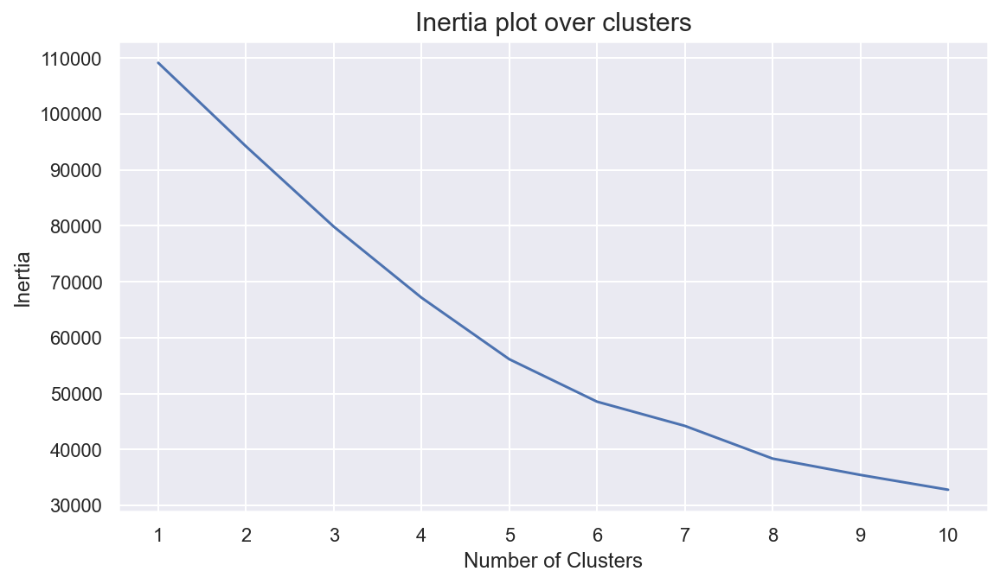

In [621]:
fig, ax = plt.subplots(figsize=(9,5))
ax.plot(range_clusters,inertia)
plt.xticks(range_clusters)
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title("Inertia plot over clusters", size=15)
plt.show()

For n_clusters = 2, the average silhouette_score is : 0.9743294795217217
For n_clusters = 3, the average silhouette_score is : 0.28586415714133995
For n_clusters = 4, the average silhouette_score is : 0.28760729193846013
For n_clusters = 5, the average silhouette_score is : 0.3146122433146401
For n_clusters = 6, the average silhouette_score is : 0.31839169508909027
For n_clusters = 7, the average silhouette_score is : 0.31753469966403697
For n_clusters = 8, the average silhouette_score is : 0.319460652157721
For n_clusters = 9, the average silhouette_score is : 0.2540166377117836
For n_clusters = 10, the average silhouette_score is : 0.2528452803965562


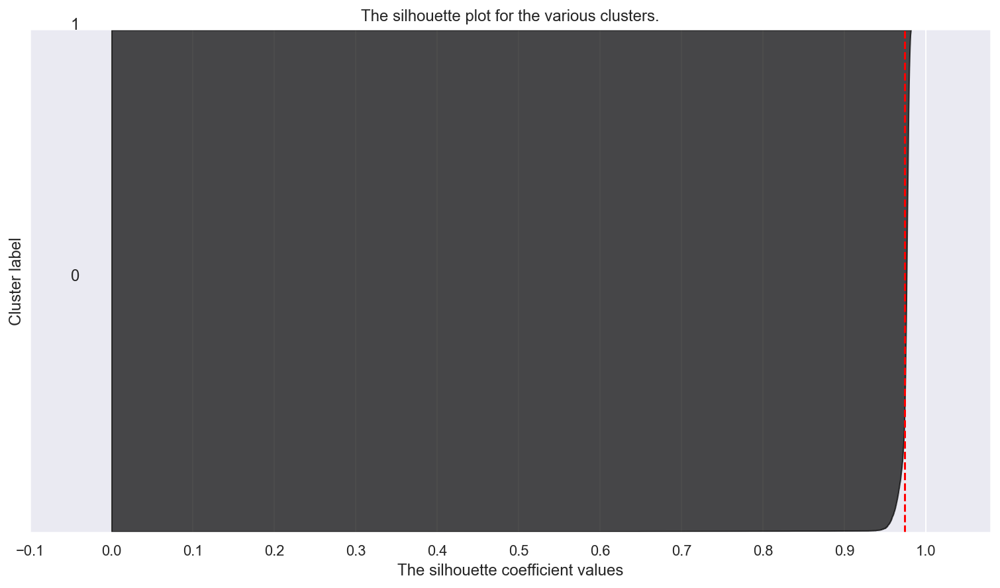

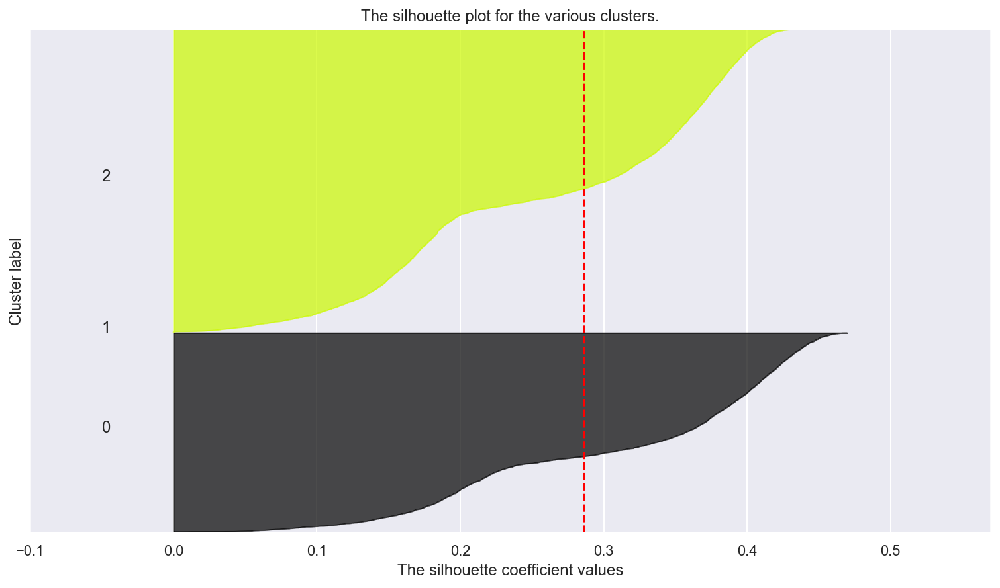

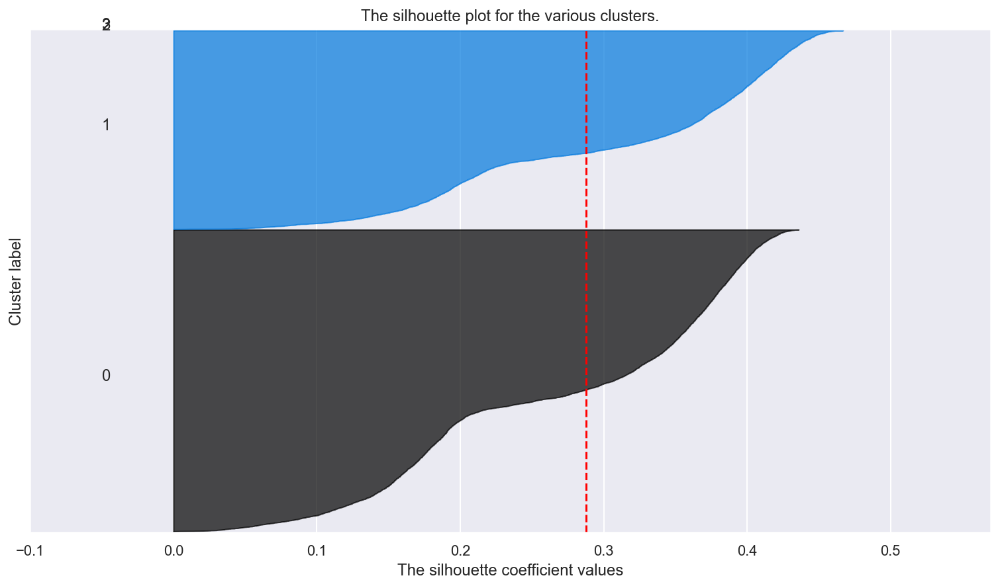

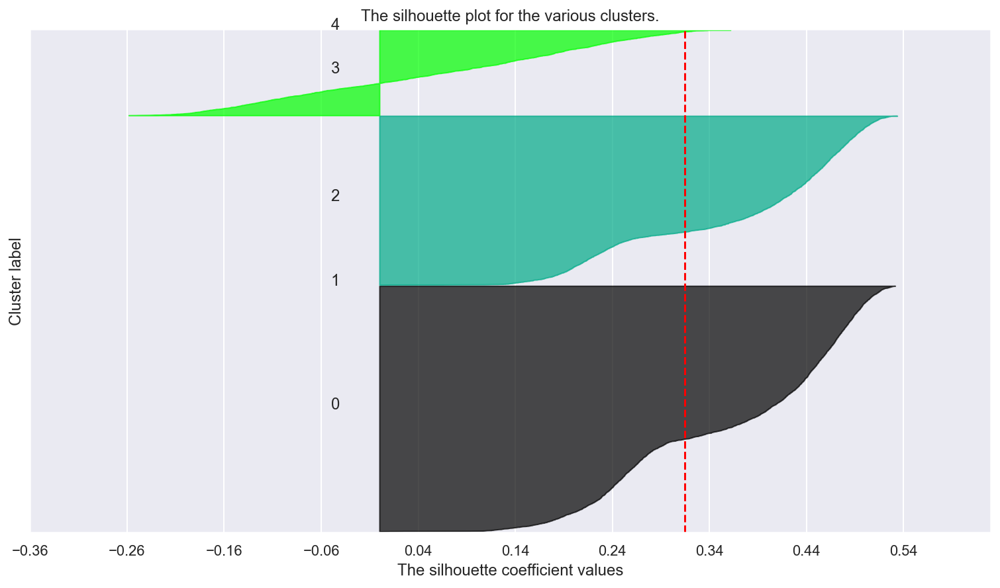

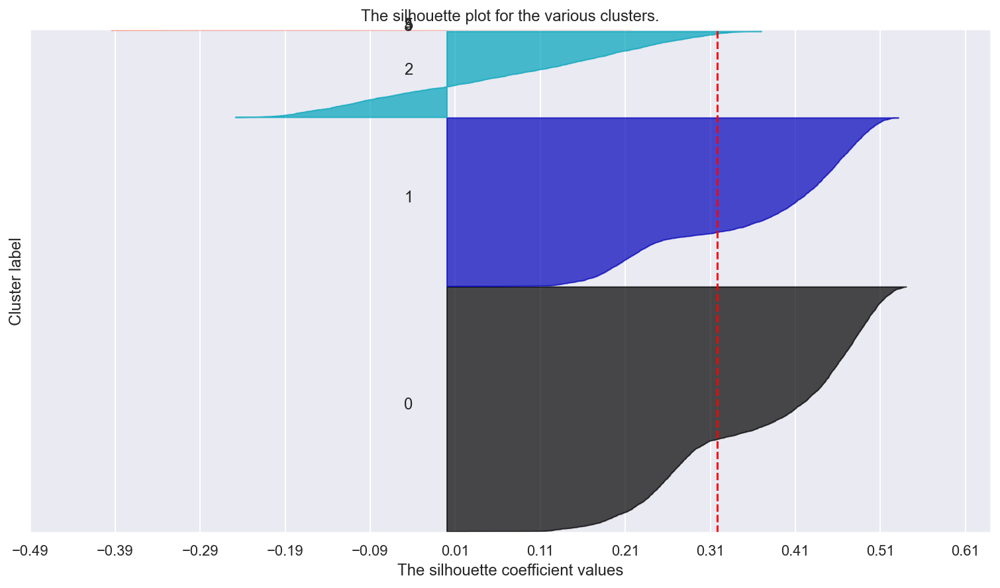

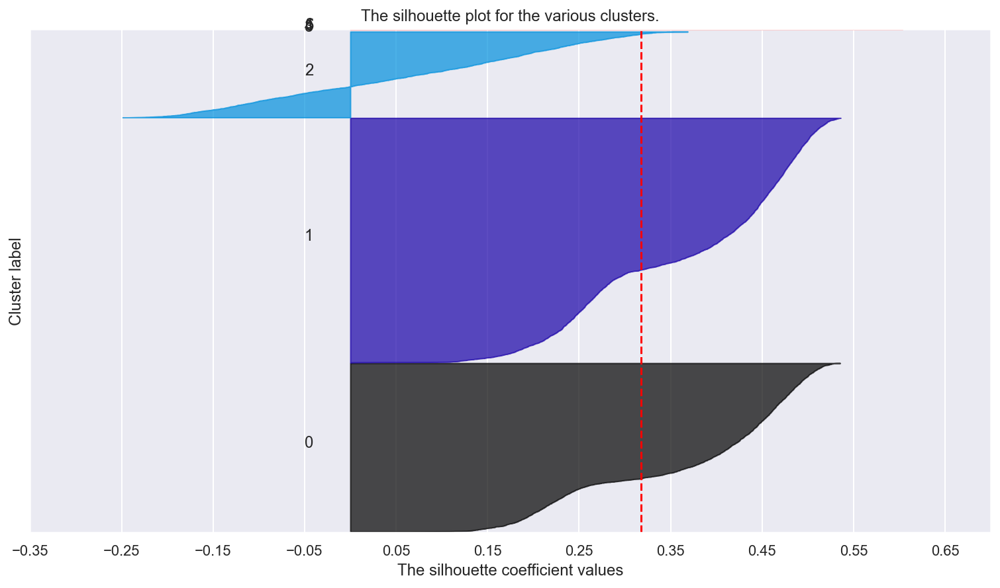

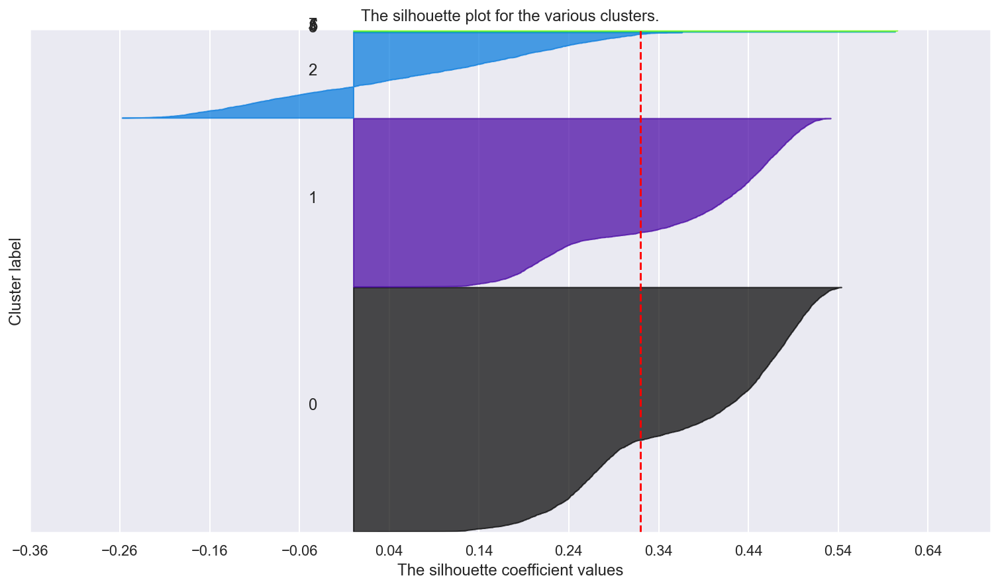

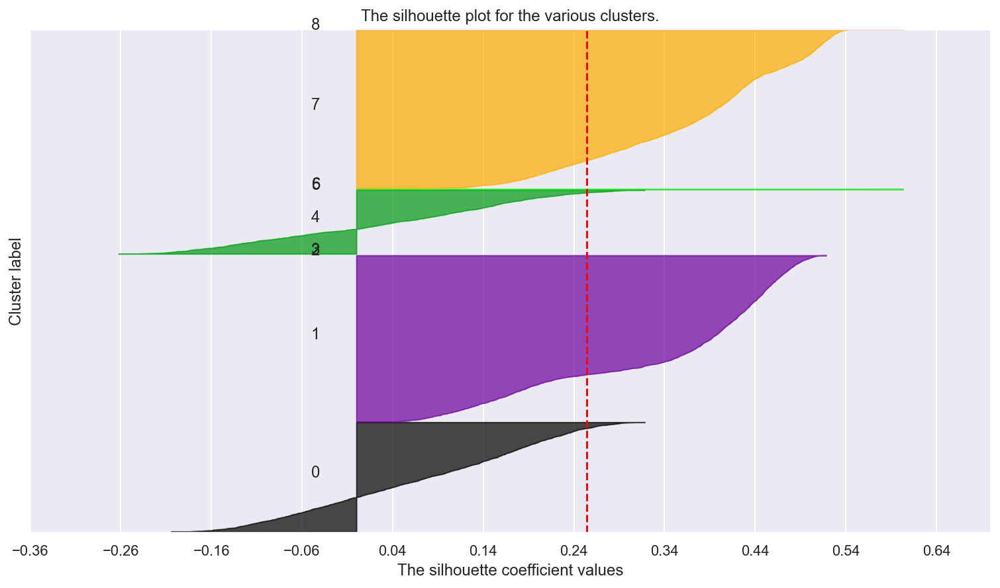

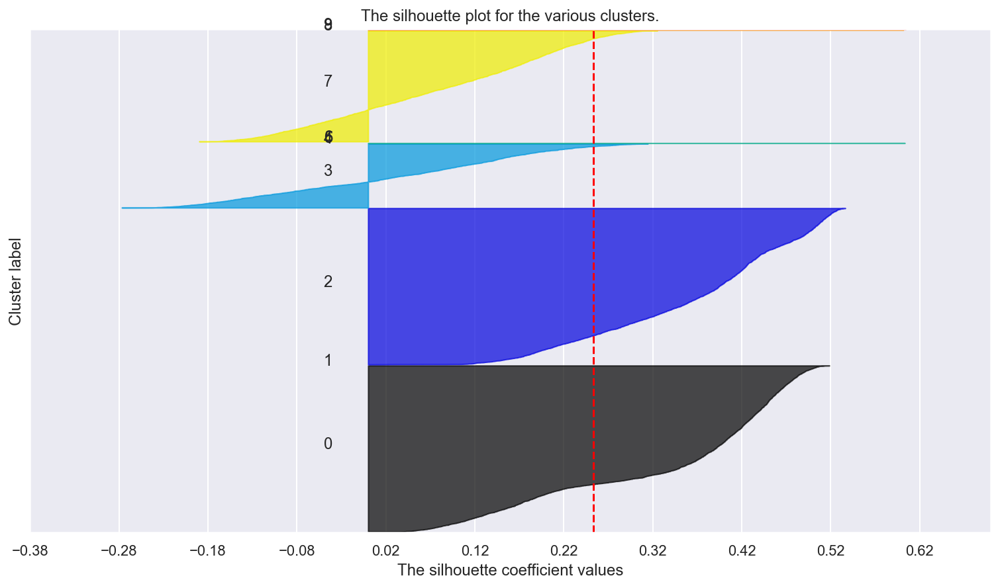

In [622]:
# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df[metric_features])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df[metric_features], cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df[metric_features], cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df[metric_features]) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

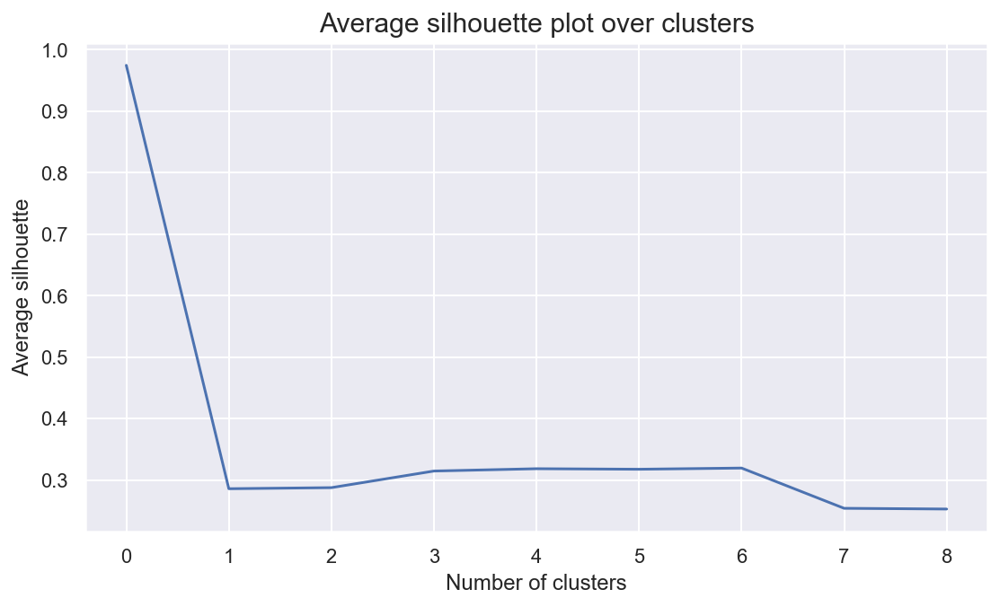

In [623]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

#### Final KMeans Clustering Solution

In [624]:
# final cluster solution
number_clusters = 7
kmclust_7 = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1)
km_labels_7 = kmclust_7.fit_predict(df[metric_features])
km_labels_7

array([0, 2, 2, ..., 0, 2, 0])

In [625]:
# Characterizing the final clusters
df_concat = pd.concat((df, pd.Series(km_labels_7, name='labels')), axis=1)
df_concat.groupby('labels').mean()

,MonthSal,GeoLivArea,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns,x0_b'2 - High School',x0_b'3 - BSc/MSc',x0_b'4 - PhD',x1_1.0,PC0,PC1,PC2,PC3
labels,,,,,,,,,,,,,,,,,,
0.0,0.028785,2.704088,0.004088,-0.006020,-0.001691,0.001247,0.025431,0.005636,-0.003618,0.016304,0.332182,0.470639,0.070524,0.708405,0.011223,-0.007264,0.025144,0.028884
1.0,-0.009811,2.701031,-0.007154,0.007858,-0.006060,-0.001570,-0.011610,0.005868,0.013351,-0.009139,0.349524,0.462530,0.063838,0.700634,0.002259,0.011919,-0.020652,-0.004942
2.0,-0.030627,2.745054,0.012101,-0.010392,0.020357,0.001980,-0.016765,-0.026927,-0.030467,-0.005919,0.334087,0.477106,0.073488,0.724138,-0.027438,-0.019251,0.008561,-0.043576
3.0,1.219829,4.000000,0.142866,-0.117516,-0.556661,0.181715,0.139924,-0.381271,1.279405,0.074942,0.000000,0.000000,0.000000,0.000000,0.443290,-0.139595,-0.080278,1.154503
4.0,0.507501,4.000000,-0.003234,-0.011235,0.189813,-0.209120,-0.065605,-0.280142,-0.188972,-0.161074,0.000000,1.000000,0.000000,1.000000,-0.548551,-0.063092,0.211271,0.240842
5.0,0.870156,2.000000,-0.118898,0.101901,0.077927,-0.217061,0.044479,-0.489383,0.114252,-0.136123,0.000000,0.000000,0.000000,1.000000,-0.528447,0.098414,0.307957,0.592260
6.0,0.160599,3.200000,0.061598,-0.029749,0.036000,0.132194,-0.028556,0.068777,-0.305897,0.070720,0.400000,0.600000,0.000000,0.800000,-0.043219,-0.078379,0.144344,-0.039186


In [626]:
# final cluster solution
number_clusters = 6
kmclust_6 = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1)
km_labels_6 = kmclust_6.fit_predict(df[metric_features])
km_labels_6

array([1, 2, 2, ..., 1, 2, 1])

In [627]:
# Characterizing the final clusters
df_concat = pd.concat((df, pd.Series(km_labels_6, name='labels')), axis=1)
df_concat.groupby('labels').mean()

,MonthSal,GeoLivArea,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns,x0_b'2 - High School',x0_b'3 - BSc/MSc',x0_b'4 - PhD',x1_1.0,PC0,PC1,PC2,PC3
labels,,,,,,,,,,,,,,,,,,
0.0,-0.010609,2.701605,-0.007193,0.007893,-0.006329,-0.001264,-0.011480,0.006250,0.012997,-0.008948,0.349515,0.462651,0.063800,0.701011,0.002798,0.012030,-0.020796,-0.005431
1.0,0.029653,2.702882,0.004275,-0.006142,-0.001257,0.001114,0.025148,0.005880,-0.003571,0.016251,0.332565,0.470605,0.070605,0.708934,0.010863,-0.007534,0.025250,0.029206
2.0,-0.031079,2.745619,0.012177,-0.010451,0.020161,0.002270,-0.016589,-0.027550,-0.030584,-0.005755,0.332956,0.477671,0.073488,0.723573,-0.027289,-0.019344,0.008820,-0.043914
3.0,1.219829,4.000000,0.142866,-0.117516,-0.556661,0.181715,0.139924,-0.381271,1.279405,0.074942,0.000000,0.000000,0.000000,0.000000,0.443290,-0.139595,-0.080278,1.154503
4.0,0.507501,4.000000,-0.003234,-0.011235,0.189813,-0.209120,-0.065605,-0.280142,-0.188972,-0.161074,0.000000,1.000000,0.000000,1.000000,-0.548551,-0.063092,0.211271,0.240842
5.0,0.518506,3.000000,-0.051338,0.036272,0.066664,-0.163659,0.006641,-0.258985,0.051419,-0.108710,0.428571,0.285714,0.000000,0.428571,-0.348058,0.026114,0.155885,0.353253


## Self-organizing maps

In [628]:
# This som implementation does not have a random seed parameter
# We're going to set it up ourselves
np.random.seed(42)

sm = sompy.SOMFactory().build(
    df[metric_features].values, 
    mapsize=[10, 10],  # NEEDS TO BE A LIST
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=metric_features
)
sm.train(n_job=4, verbose='info', train_rough_len=100, train_finetune_len=100)

 Training...
 pca_linear_initialization took: 0.141000 seconds
 Rough training...
 radius_ini: 2.000000 , radius_final: 1.000000, trainlen: 100

 epoch: 1 ---> elapsed time:  0.307000, quantization error: 1.735706

 epoch: 2 ---> elapsed time:  0.088000, quantization error: 1.865599

 epoch: 3 ---> elapsed time:  0.084000, quantization error: 1.764757

 epoch: 4 ---> elapsed time:  0.085000, quantization error: 1.692757

 epoch: 5 ---> elapsed time:  0.079000, quantization error: 1.625005

 epoch: 6 ---> elapsed time:  0.075000, quantization error: 1.593041

 epoch: 7 ---> elapsed time:  0.077000, quantization error: 1.574139

 epoch: 8 ---> elapsed time:  0.078000, quantization error: 1.563539

 epoch: 9 ---> elapsed time:  0.080000, quantization error: 1.551300

 epoch: 10 ---> elapsed time:  0.074000, quantization error: 1.544262

 epoch: 11 ---> elapsed time:  0.088000, quantization error: 1.538545

 epoch: 12 ---> elapsed time:  0.087000, quantization error: 1.533407

 epoch: 13 -

## Visualizing data with SOMs

### Component planes

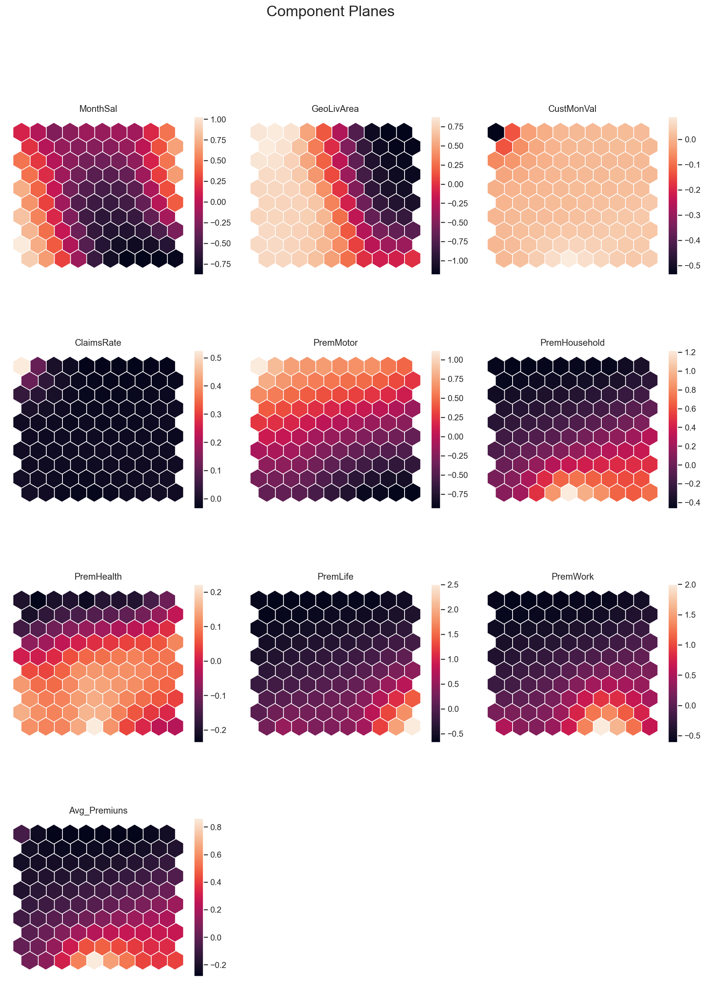

In [629]:
sns.set()
view2D = View2D(12, 12, "", text_size=10)
view2D.show(sm, col_sz=3, what='codebook')
plt.subplots_adjust(top=0.90)
plt.suptitle("Component Planes", fontsize=20)
plt.show()

## U-matrix 

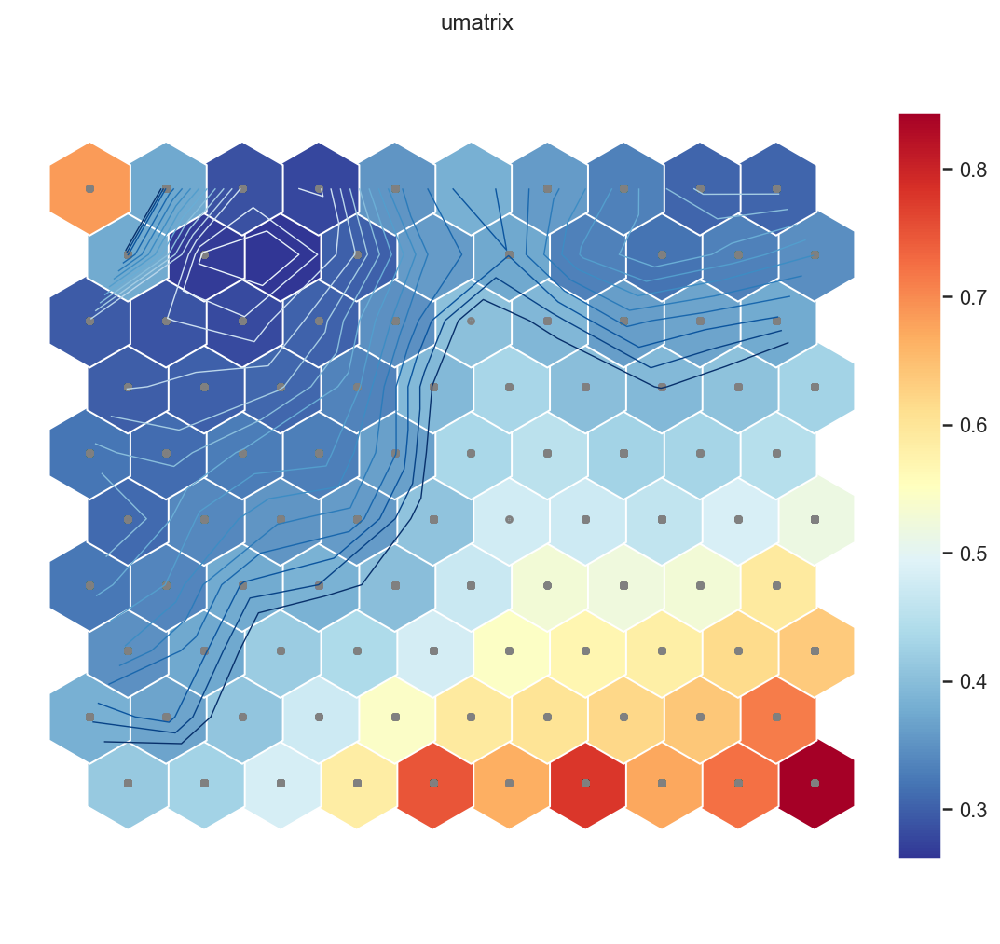

array([[0.68517405, 0.37440143, 0.28743358, 0.27705355, 0.35290009,
        0.38174296, 0.36009033, 0.33260392, 0.30606875, 0.30485543],
       [0.37553923, 0.26706288, 0.2607917 , 0.29974357, 0.35978914,
        0.37426159, 0.33369519, 0.31916989, 0.33159462, 0.34592611],
       [0.29686326, 0.29017315, 0.28100974, 0.30290442, 0.34837118,
        0.40292258, 0.39097346, 0.36252552, 0.37004322, 0.37653853],
       [0.2979676 , 0.30116358, 0.30701221, 0.33393874, 0.39457773,
        0.43202696, 0.40132133, 0.39297311, 0.40444693, 0.42869432],
       [0.32099702, 0.31200637, 0.32870239, 0.33079063, 0.36417525,
        0.43576662, 0.45252108, 0.42768074, 0.43049567, 0.44796535],
       [0.31061727, 0.33992207, 0.35392806, 0.36074236, 0.40725285,
        0.47832043, 0.47466964, 0.46102548, 0.48562539, 0.51790655],
       [0.32306101, 0.33694308, 0.37573157, 0.38426829, 0.4010828 ,
        0.47007595, 0.5275047 , 0.52265055, 0.52803628, 0.59314168],
       [0.3481427 , 0.37290262, 0.4181470

In [630]:
# Here you have U-matrix
u = sompy.umatrix.UMatrixView(9, 9, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    sm, 
    distance=2, 
    row_normalized=False,
    show_data=True, 
    contour=True, # Visualize isomorphic curves
    blob=False
)

np.flip(UMAT[1], axis=1) # U-matrix values - they match with the plot colors

## Hit-map 

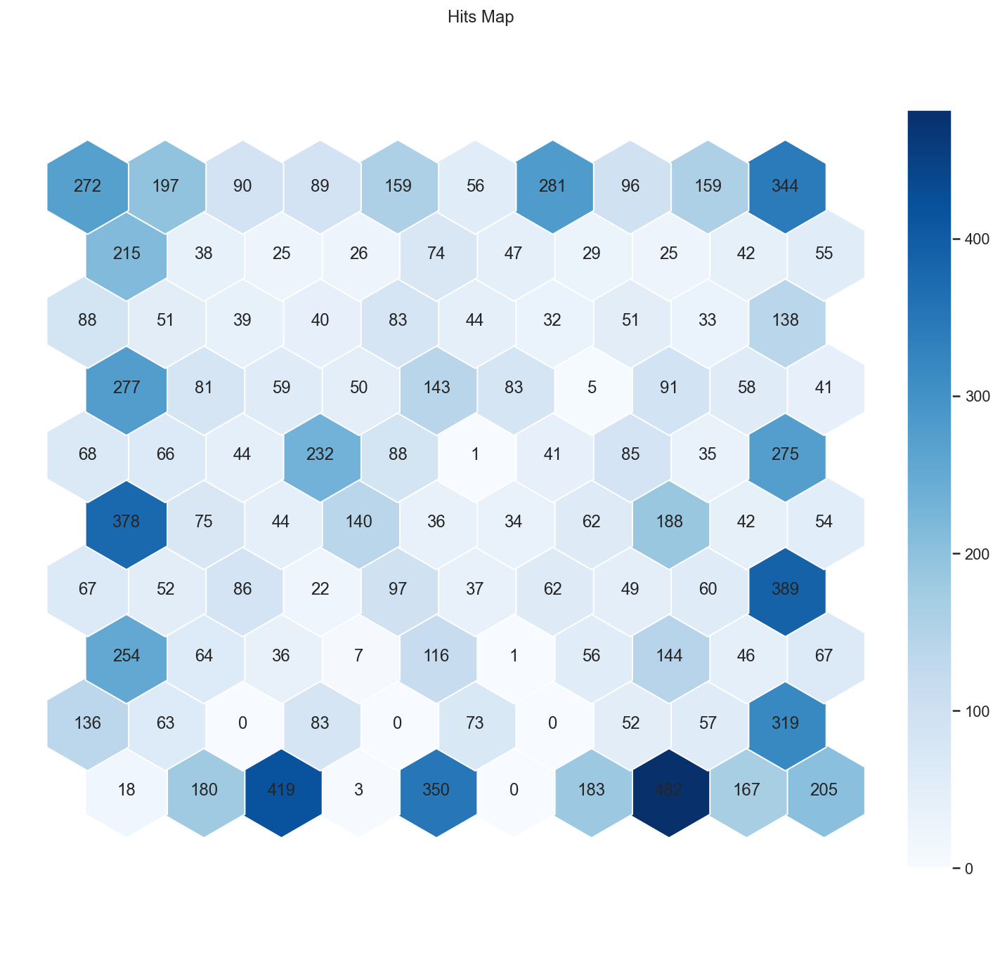

In [631]:
vhts  = BmuHitsView(12,12,"Hits Map")
vhts.show(sm, anotate=True, onlyzeros=False, labelsize=12, cmap="Blues")
plt.show()

## Clustering with SOMs: K-means SOM vs Emergent SOM

In [632]:
# This som implementation does not have a random seed parameter
# We're going to set it up ourselves
np.random.seed(42)

# Notice that the SOM did not converge - We're under a time constraint for this class
sm = sompy.SOMFactory().build(
    df[metric_features].values, 
    mapsize=[50, 50],  # NEEDS TO BE A LIST
    lattice='hexa',
    neighborhood='gaussian',
    training='batch',
    component_names=metric_features
)
sm.train(n_job=-1, verbose='info', train_rough_len=100, train_finetune_len=100)

 Training...
 pca_linear_initialization took: 0.095000 seconds
 Rough training...
 radius_ini: 7.000000 , radius_final: 1.750000, trainlen: 100

 epoch: 1 ---> elapsed time:  1.045000, quantization error: 1.721615

 epoch: 2 ---> elapsed time:  1.009000, quantization error: 1.967774

 epoch: 3 ---> elapsed time:  1.072000, quantization error: 1.904141

 epoch: 4 ---> elapsed time:  1.031000, quantization error: 1.893545

 epoch: 5 ---> elapsed time:  0.988000, quantization error: 1.876080

 epoch: 6 ---> elapsed time:  1.001000, quantization error: 1.846320

 epoch: 7 ---> elapsed time:  0.996000, quantization error: 1.832090

 epoch: 8 ---> elapsed time:  1.000000, quantization error: 1.823960

 epoch: 9 ---> elapsed time:  1.003000, quantization error: 1.814614

 epoch: 10 ---> elapsed time:  0.999000, quantization error: 1.800708

 epoch: 11 ---> elapsed time:  0.992000, quantization error: 1.787871

 epoch: 12 ---> elapsed time:  0.994000, quantization error: 1.776964

 epoch: 13 -

In [633]:
sm.codebook.matrix

array([[-5.522140e-01, -1.350374e+00,  2.439900e-02, ..., -7.425820e-01,
        -6.914290e-01, -3.263910e-01],
       [-4.412700e-01, -1.350268e+00,  5.698000e-02, ..., -7.479840e-01,
        -6.869740e-01, -3.146410e-01],
       [-3.405440e-01, -1.349924e+00,  4.821200e-02, ..., -7.382580e-01,
        -6.559890e-01, -2.908970e-01],
       ...,
       [ 8.756810e-01,  7.338940e-01, -1.231200e-02, ...,  5.382290e-01,
         1.576479e+00, -6.668300e-02],
       [ 9.142040e-01,  7.328190e-01, -8.078000e-03, ...,  2.073070e-01,
         1.716429e+00,  1.149000e-03],
       [ 9.441790e-01,  7.159990e-01, -6.727000e-03, ..., -1.286080e-01,
         1.875892e+00, -6.293000e-03]])

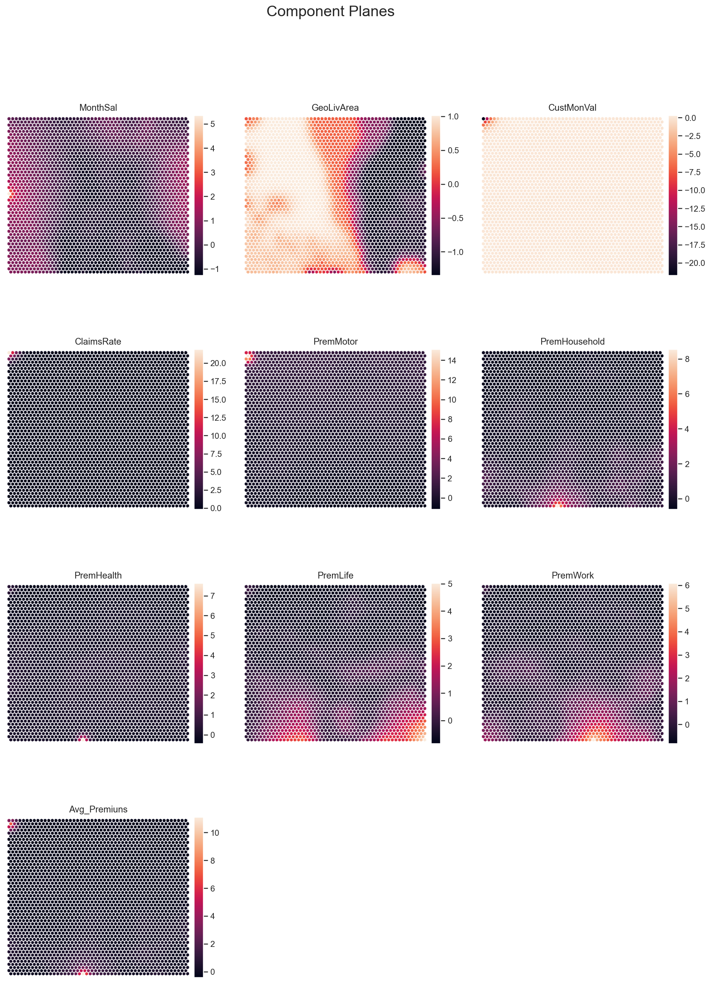

In [634]:
# Component planes on the 50x50 grid
sns.set()
view2D = View2D(12,12,"", text_size=10)
view2D.show(sm, col_sz=3, what='codebook')
plt.subplots_adjust(top=0.90)
plt.suptitle("Component Planes", fontsize=20)
plt.show()

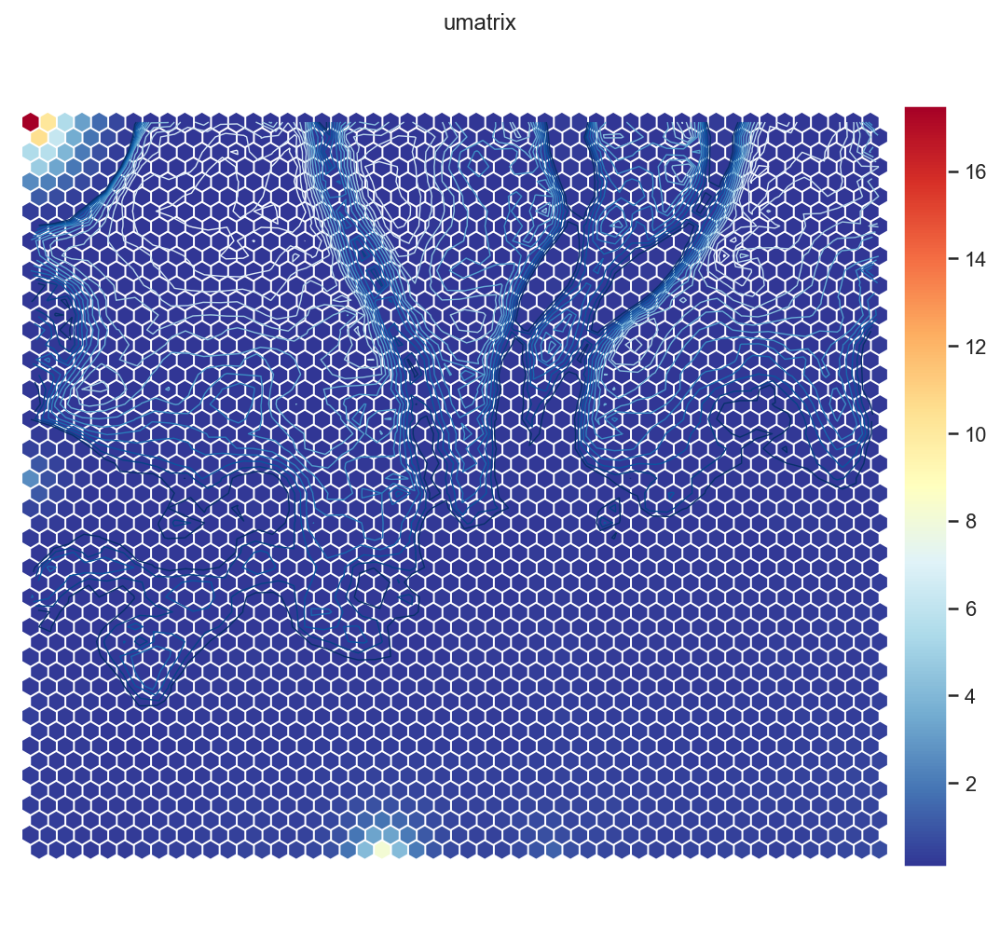

In [635]:
# U-matrix of the 50x50 grid
u = sompy.umatrix.UMatrixView(9, 9, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    sm, 
    distance=2, 
    row_normalized=False, 
    show_data=False, 
    contour=True # Visualize isomorphic curves
)

## K-Means on top of SOM units

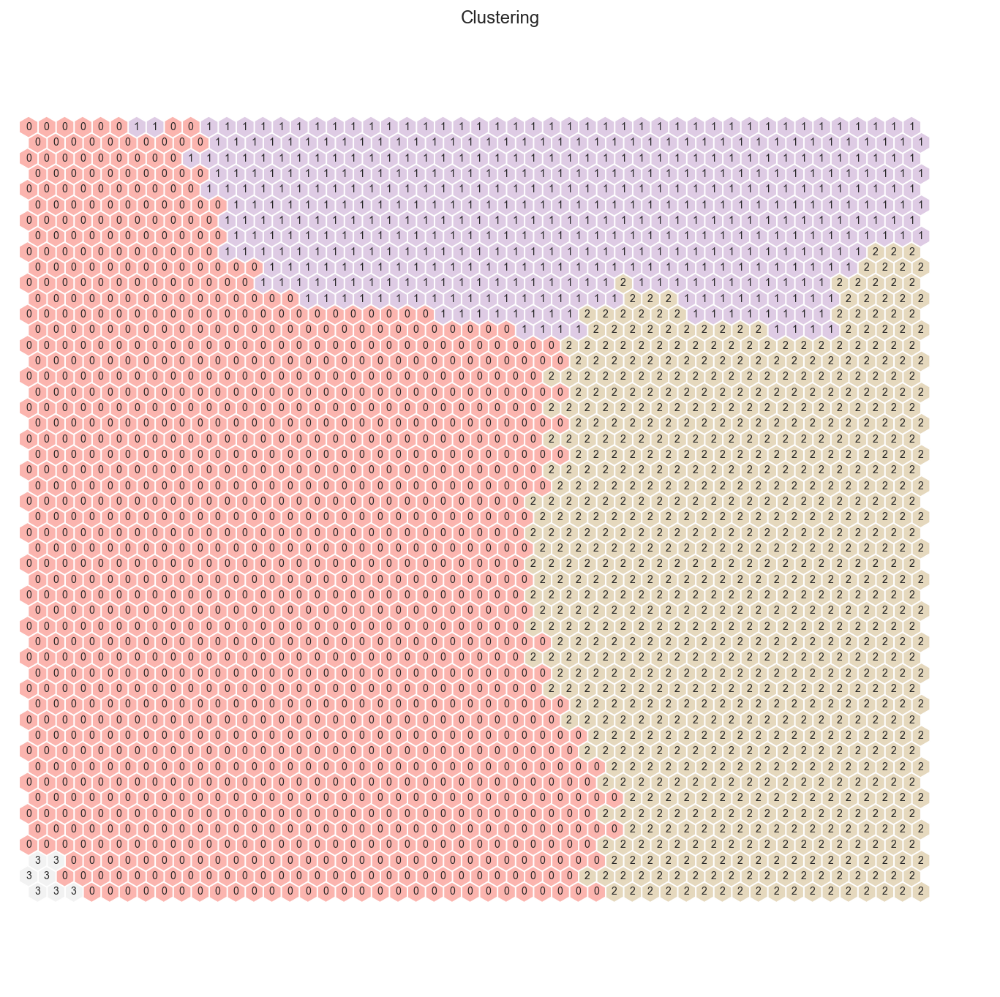

In [636]:
# Perform K-Means clustering on top of the 2500 untis (sm.get_node_vectors() output)
kmeans = KMeans(n_clusters=4, init='k-means++', n_init=20, random_state=42)
nodeclus_labels = kmeans.fit_predict(sm.codebook.matrix)
sm.cluster_labels = nodeclus_labels  # setting the cluster labels of sompy

hits = HitMapView(12, 12,"Clustering", text_size=10)
hits.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

### Hierarchical Clustering on top of SOM units

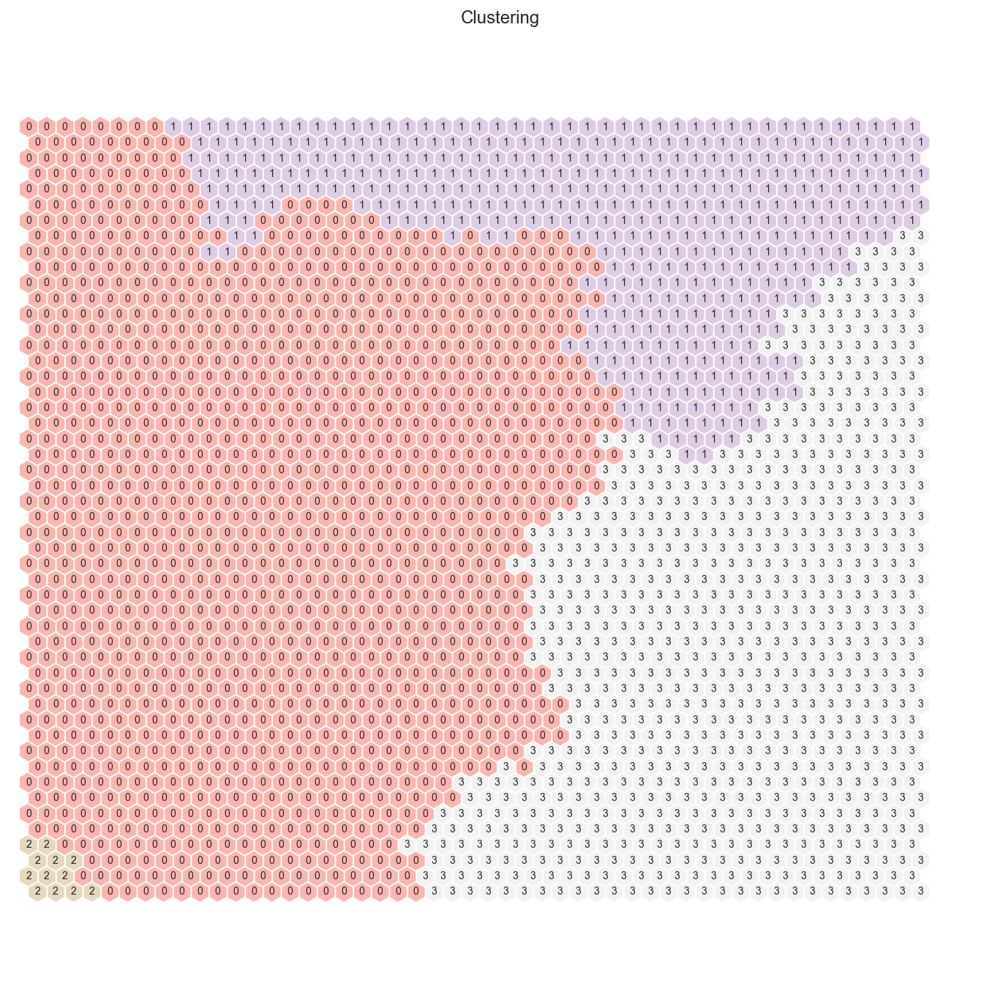

In [637]:
# Perform Hierarchical clustering on top of the 2500 untis (sm.get_node_vectors() output)
hierclust = AgglomerativeClustering(n_clusters=4, linkage='ward')
nodeclus_labels = hierclust.fit_predict(sm.codebook.matrix)
sm.cluster_labels = nodeclus_labels  # setting the cluster labels of sompy

hits  = HitMapView(12, 12,"Clustering",text_size=10)
hits.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

## Final SOM Clustering solution 

In [638]:
# Check the nodes and and respective clusters
nodes = sm.codebook.matrix

df_nodes = pd.DataFrame(nodes, columns=metric_features)
df_nodes['label'] = nodeclus_labels
df_nodes

,MonthSal,GeoLivArea,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns,label
0,-0.552214,-1.350374,0.024399,-0.050511,0.940141,-0.523279,-0.330153,-0.742582,-0.691429,-0.326391,3
1,-0.441270,-1.350268,0.056980,-0.085339,0.931764,-0.506636,-0.325187,-0.747984,-0.686974,-0.314641,3
2,-0.340544,-1.349924,0.048212,-0.074777,0.918123,-0.478984,-0.317486,-0.738258,-0.655989,-0.290897,3
3,-0.272731,-1.349240,0.017732,-0.042342,0.884781,-0.461627,-0.304787,-0.697870,-0.602204,-0.275004,3
4,-0.236778,-1.347371,0.014891,-0.040700,0.815319,-0.475311,-0.282849,-0.648443,-0.552678,-0.292303,3
...,...,...,...,...,...,...,...,...,...,...,...
2495,0.890160,0.782099,-0.022734,0.013366,-0.581629,-0.214213,0.109936,0.901585,1.063202,-0.146151,0
2496,0.880302,0.792782,-0.014665,0.006052,-0.564857,-0.168557,0.082543,0.692753,1.282539,-0.118722,0
2497,0.875681,0.733894,-0.012312,0.005760,-0.566294,-0.087887,0.044030,0.538229,1.576479,-0.066683,0
2498,0.914204,0.732819,-0.008078,0.006211,-0.588794,0.024208,0.063194,0.207307,1.716429,0.001149,0


In [639]:
nodes = sm.codebook.matrix

df_nodes = pd.DataFrame(nodes, columns=metric_features)
df_nodes['label'] = nodeclus_labels
df_nodes

,MonthSal,GeoLivArea,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns,label
0,-0.552214,-1.350374,0.024399,-0.050511,0.940141,-0.523279,-0.330153,-0.742582,-0.691429,-0.326391,3
1,-0.441270,-1.350268,0.056980,-0.085339,0.931764,-0.506636,-0.325187,-0.747984,-0.686974,-0.314641,3
2,-0.340544,-1.349924,0.048212,-0.074777,0.918123,-0.478984,-0.317486,-0.738258,-0.655989,-0.290897,3
3,-0.272731,-1.349240,0.017732,-0.042342,0.884781,-0.461627,-0.304787,-0.697870,-0.602204,-0.275004,3
4,-0.236778,-1.347371,0.014891,-0.040700,0.815319,-0.475311,-0.282849,-0.648443,-0.552678,-0.292303,3
...,...,...,...,...,...,...,...,...,...,...,...
2495,0.890160,0.782099,-0.022734,0.013366,-0.581629,-0.214213,0.109936,0.901585,1.063202,-0.146151,0
2496,0.880302,0.792782,-0.014665,0.006052,-0.564857,-0.168557,0.082543,0.692753,1.282539,-0.118722,0
2497,0.875681,0.733894,-0.012312,0.005760,-0.566294,-0.087887,0.044030,0.538229,1.576479,-0.066683,0
2498,0.914204,0.732819,-0.008078,0.006211,-0.588794,0.024208,0.063194,0.207307,1.716429,0.001149,0


In [640]:
# Check the nodes and and respective clusters
nodes = sm.codebook.matrix

df_nodes = pd.DataFrame(nodes, columns=metric_features)
df_nodes['label'] = nodeclus_labels
df_nodes

,MonthSal,GeoLivArea,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns,label
0,-0.552214,-1.350374,0.024399,-0.050511,0.940141,-0.523279,-0.330153,-0.742582,-0.691429,-0.326391,3
1,-0.441270,-1.350268,0.056980,-0.085339,0.931764,-0.506636,-0.325187,-0.747984,-0.686974,-0.314641,3
2,-0.340544,-1.349924,0.048212,-0.074777,0.918123,-0.478984,-0.317486,-0.738258,-0.655989,-0.290897,3
3,-0.272731,-1.349240,0.017732,-0.042342,0.884781,-0.461627,-0.304787,-0.697870,-0.602204,-0.275004,3
4,-0.236778,-1.347371,0.014891,-0.040700,0.815319,-0.475311,-0.282849,-0.648443,-0.552678,-0.292303,3
...,...,...,...,...,...,...,...,...,...,...,...
2495,0.890160,0.782099,-0.022734,0.013366,-0.581629,-0.214213,0.109936,0.901585,1.063202,-0.146151,0
2496,0.880302,0.792782,-0.014665,0.006052,-0.564857,-0.168557,0.082543,0.692753,1.282539,-0.118722,0
2497,0.875681,0.733894,-0.012312,0.005760,-0.566294,-0.087887,0.044030,0.538229,1.576479,-0.066683,0
2498,0.914204,0.732819,-0.008078,0.006211,-0.588794,0.024208,0.063194,0.207307,1.716429,0.001149,0


# Density Based Clustering

In [642]:
def get_ss(df):
    """Computes the sum of squares for all variables given a dataset
    """
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

## DBSCAN (Density-based spatial clustering of applications with noise)

In [643]:
# Perform DBSCAN clustering
dbscan = DBSCAN(eps=1.9, min_samples=20, n_jobs=4)
dbscan_labels = dbscan.fit_predict(df[metric_features])

dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)

Number of estimated clusters : 2


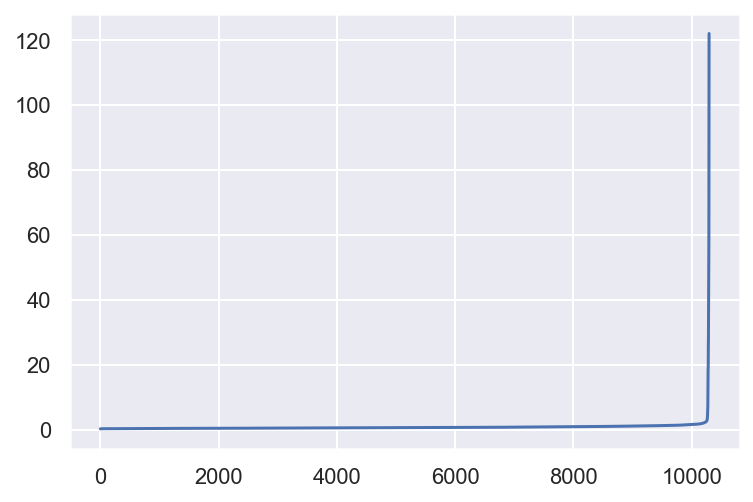

In [644]:
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=20)
neigh.fit(df[metric_features])
distances, _ = neigh.kneighbors(df[metric_features])
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.show()

In [645]:
# Concatenating the labels to df
df_concat = pd.concat([df[metric_features], pd.Series(dbscan_labels, index=df.index, name="dbscan_labels")], axis=1)
df_concat.head()

,MonthSal,GeoLivArea,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns,dbscan_labels
CustID,,,,,,,,,,,
1.0,-0.285319,1.0,0.104371,-0.120944,0.356343,-0.371495,-0.085147,0.112530,-0.472709,-0.211570,0
2.0,-1.583607,4.0,-0.158822,0.129328,-1.054121,0.583611,-0.185461,3.232531,1.266349,0.309092,0
3.0,-0.198767,3.0,0.167947,-0.158656,-0.445815,0.039903,-0.158785,0.944840,1.127793,-0.052359,0
4.0,-1.218355,4.0,-0.100160,0.084759,-0.557701,-0.473883,0.472072,-0.134371,-0.249578,-0.349225,0
5.0,-0.643647,4.0,-0.073321,0.053904,0.180360,-0.461262,0.037346,-0.484729,0.005902,-0.288629,0


In [646]:
# Detecting noise (potential outliers)
df_concat.loc[df_concat['dbscan_labels'] == -1].head()

,MonthSal,GeoLivArea,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns,dbscan_labels
CustID,,,,,,,,,,,
52.0,0.629541,4.0,-7.653720,8.439743,1.214703,-0.540109,-0.480045,-0.776270,-0.977239,-0.344302,-1
113.0,-0.132122,1.0,-4.572573,5.110777,1.029786,-0.584213,-0.390990,-0.799754,-0.589634,-0.364564,-1
136.0,-0.286185,4.0,-5.333151,4.819364,-0.013491,-0.135094,-0.095290,2.005222,-0.860314,-0.059487,-1
150.0,-1.317891,4.0,0.039994,-0.038663,-1.113491,-0.037385,-0.480045,-0.489383,7.997307,-0.007379,-1
172.0,-1.229607,4.0,-85.242773,87.580672,0.366836,-0.373055,-0.016006,-0.736284,-0.442309,-0.246450,-1


In [647]:
# Computing the R^2 of the cluster solution
df_nonoise = df_concat.loc[df_concat['dbscan_labels'] != -1]
sst = get_ss(df[metric_features])  # get total sum of squares
ssw_labels = df_nonoise.groupby(by='dbscan_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.5067


# Cluster Analysis

In [648]:
# Based on the hyperparameters found in the previous class
dbscan = DBSCAN(eps=1.9, min_samples=20, n_jobs=4)
dbscan_labels = dbscan.fit_predict(df[metric_features])
dbscan_labels

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [649]:
# Save the newly detected outliers (they will be classified later based on the final clusters)
df_out = df[dbscan_labels==-1].copy()

# New df without outliers and 'CustMonVal'
df = df[dbscan_labels!=-1]\
    .drop(columns='CustMonVal')\
    .copy()

# Update metric features list
metric_features = metric_features.drop('CustMonVal')

## Clustering by Perspectives

Demographic/Behavioral Perspective:


Product Perspective:

In [650]:
# Split variables into perspectives (example, requires critical thinking and domain knowledge)
demographic_features = [
    'MonthSal',
    'GeoLivArea', 'ClaimsRate', 'Avg_Premiuns',
]

preference_features = [
    'PremMotor', 'PremHousehold', 'PremHealth','PremLife', 'PremWork', 
]

df_dem = df[demographic_features].copy()
df_prf = df[preference_features].copy()
df_prf = df[preference_features].copy()

## Merging the Perspectives

In [651]:
def get_ss(df):
    """Computes the sum of squares for all variables given a dataset
    """
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

def r2(df, labels):
    sst = get_ss(df)
    ssw = np.sum(df.groupby(labels).apply(get_ss))
    return 1 - ssw/sst
    
def get_r2_scores(df, clusterer, min_k=2, max_k=10):
    """
    Loop over different values of k. To be used with sklearn clusterers.
    """
    r2_clust = {}
    for n in range(min_k, max_k):
        clust = clone(clusterer).set_params(n_clusters=n)
        labels = clust.fit_predict(df)
        r2_clust[n] = r2(df, labels)
    return r2_clust


# Set up the clusterers
kmeans = KMeans(
    init='k-means++',
    n_init=20,
    random_state=42
)

hierarchical = AgglomerativeClustering(
    affinity='euclidean'
)

In [652]:
# Applying the right clustering (algorithm and number of clusters) for each perspective
kmeans_prod = KMeans(
    n_clusters=3,
    init='k-means++',
    n_init=20,
    random_state=42
)
prod_labels = kmeans_prod.fit_predict(df_prf)

kmeans_behav = KMeans(
    n_clusters=4,
    init='k-means++',
    n_init=20,
    random_state=42
)
behavior_labels = kmeans_behav.fit_predict(df_dem)

df['product_labels'] = prod_labels
df['behavior_labels'] = behavior_labels

In [653]:
# Count label frequencies (contigency table)
df.groupby(['product_labels', 'behavior_labels'])\
    .size()\
    .to_frame()\
    .reset_index()\
    .pivot('behavior_labels', 'product_labels', 0)

product_labels,0,1,2
behavior_labels,,,
0,1699,196,1289
1,843,421,727
2,1119,119,847
3,1274,673,1054


### Manual merging: Merge lowest frequency clusters into closest clusters 

In [654]:
# Clusters with low frequency to be merged:
to_merge = [(2,2), (2,0), (0,2), (3,1)]

df_centroids = df.groupby(['behavior_labels', 'product_labels'])\
    [metric_features].mean()

# Computing the euclidean distance matrix between the centroids
euclidean = pairwise_distances(df_centroids)
df_dists = pd.DataFrame(
    euclidean, columns=df_centroids.index, index=df_centroids.index
)

# Merging each low frequency clustering (source) to the closest cluster (target)
source_target = {}
for clus in to_merge:
    if clus not in source_target.values():
        source_target[clus] = df_dists.loc[clus].sort_values().index[1]

source_target

{(2, 2): (2, 0), (0, 2): (0, 0), (3, 1): (0, 1)}

In [655]:
df_ = df.copy()

# Changing the behavior_labels and product_labels based on source_target
for source, target in source_target.items():
    mask = (df_['behavior_labels']==source[0]) & (df_['product_labels']==source[1])
    df_.loc[mask, 'behavior_labels'] = target[0]
    df_.loc[mask, 'product_labels'] = target[1]

# New contigency table
df_.groupby(['product_labels', 'behavior_labels'])\
    .size()\
    .to_frame()\
    .reset_index()\
    .pivot('behavior_labels', 'product_labels', 0)

product_labels,0,1,2
behavior_labels,,,
0,2988.0,869.0,NaN
1,843.0,421.0,727.0
2,1966.0,119.0,NaN
3,1274.0,NaN,1054.0


### Merging using Hierarchical clustering 

In [656]:
# Centroids of the concatenated cluster labels
df_centroids = df.groupby(['behavior_labels', 'product_labels'])\
    [metric_features].mean()
df_centroids

MonthSal  GeoLivArea  ClaimsRate  PremMotor  \
behavior_labels product_labels                                                
0               0               0.587558    3.667451   -0.031887   0.536437   
                1               0.794944    3.673469   -0.004116  -0.749541   
                2               0.823542    3.689682   -0.011398  -0.330415   
1               0              -0.505665    1.262159   -0.028894   0.517372   
                1              -1.113710    1.213777   -0.008621  -1.024794   
                2              -0.795744    1.236589   -0.016390  -0.415217   
2               0               0.567675    1.256479   -0.032118   0.549162   
                1               0.825542    1.268908   -0.015442  -0.770718   
                2               0.833192    1.275089   -0.012243  -0.331499   
3               0              -0.515080    3.645212   -0.032530   0.510890   
                1              -1.143012    3.670134   -0.011750  -1.000870   
                2              -0.779770    3.667932   -0.010647  -0.398809   

                                PremHousehold  PremHealth  PremLife  PremWork  \
behavior_labels product_labels                                                  
0               0                   -0.375945   -0.141148 -0.581224 -0.515164   
                1                    0.430694   -0.018856  1.527380  1.041162   
                2                    0.137945    0.132302  0.121513  0.141344   
1               0                   -0.394081   -0.117831 -0.601373 -0.541009   
                1                    0.922673   -0.045293  1.755020  1.458176   
                2                    0.203405    0.169229  0.101187  0.216612   
2               0                   -0.391467   -0.147231 -0.585848 -0.537257   
                1                    0.469795   -0.033918  1.721244  1.003467   
                2                    0.134456    0.137162  0.110053  0.142280   
3               0                   -0.394238   -0.108765 -0.600854 -0.537725   
                1                    0.881305   -0.058264  1.867789  1.401865   
                2                    0.210911    0.165626  0.079472  0.179331   

                                Avg_Premiuns  
behavior_labels product_labels                
0               0                  -0.243400  
                1                   0.240447  
                2                   0.065483  
1               0                  -0.255726  
                1                   0.536570  
                2                   0.105717  
2               0                  -0.255985  
                1                   0.266077  
                2                   0.064389  
3               0                  -0.252655  
                1                   0.513401  
                2                   0.110198

In [657]:
# Using Hierarchical clustering to merge the concatenated cluster centroids
hclust = AgglomerativeClustering(
    linkage='ward', 
    affinity='euclidean', 
    distance_threshold=0, 
    n_clusters=None
)
hclust_labels = hclust.fit_predict(df_centroids)

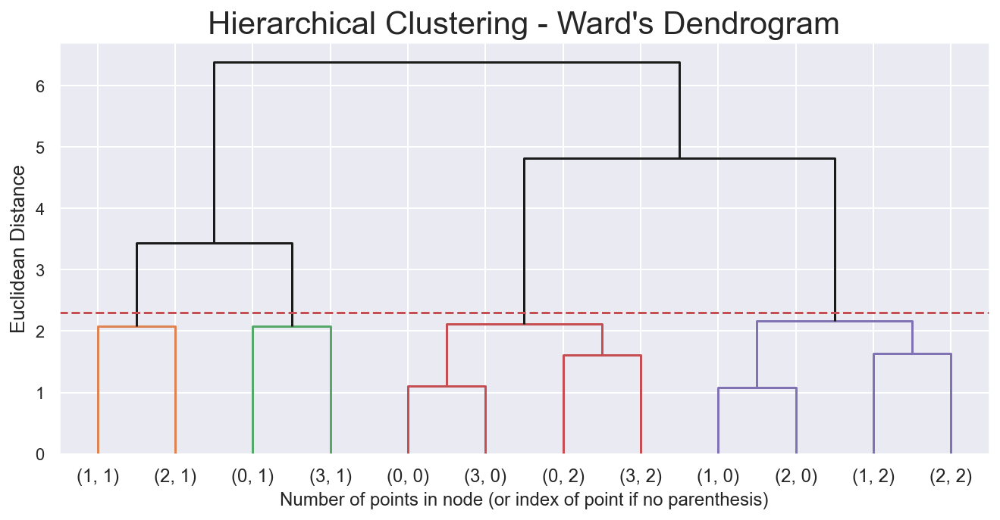

In [658]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html#sphx-glr-auto-examples-cluster-plot-agglomerative-dendrogram-py

# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 2.3
dendrogram(linkage_matrix, truncate_mode='level', labels=df_centroids.index, p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'Euclidean Distance', fontsize=13)
plt.show()

In [659]:
# Re-running the Hierarchical clustering based on the correct number of clusters
hclust = AgglomerativeClustering(
    linkage='ward', 
    affinity='euclidean', 
    n_clusters=4
)
hclust_labels = hclust.fit_predict(df_centroids)
df_centroids['hclust_labels'] = hclust_labels

df_centroids  # centroid's cluster labels

MonthSal  GeoLivArea  ClaimsRate  PremMotor  \
behavior_labels product_labels                                                
0               0               0.587558    3.667451   -0.031887   0.536437   
                1               0.794944    3.673469   -0.004116  -0.749541   
                2               0.823542    3.689682   -0.011398  -0.330415   
1               0              -0.505665    1.262159   -0.028894   0.517372   
                1              -1.113710    1.213777   -0.008621  -1.024794   
                2              -0.795744    1.236589   -0.016390  -0.415217   
2               0               0.567675    1.256479   -0.032118   0.549162   
                1               0.825542    1.268908   -0.015442  -0.770718   
                2               0.833192    1.275089   -0.012243  -0.331499   
3               0              -0.515080    3.645212   -0.032530   0.510890   
                1              -1.143012    3.670134   -0.011750  -1.000870   
                2              -0.779770    3.667932   -0.010647  -0.398809   

                                PremHousehold  PremHealth  PremLife  PremWork  \
behavior_labels product_labels                                                  
0               0                   -0.375945   -0.141148 -0.581224 -0.515164   
                1                    0.430694   -0.018856  1.527380  1.041162   
                2                    0.137945    0.132302  0.121513  0.141344   
1               0                   -0.394081   -0.117831 -0.601373 -0.541009   
                1                    0.922673   -0.045293  1.755020  1.458176   
                2                    0.203405    0.169229  0.101187  0.216612   
2               0                   -0.391467   -0.147231 -0.585848 -0.537257   
                1                    0.469795   -0.033918  1.721244  1.003467   
                2                    0.134456    0.137162  0.110053  0.142280   
3               0                   -0.394238   -0.108765 -0.600854 -0.537725   
                1                    0.881305   -0.058264  1.867789  1.401865   
                2                    0.210911    0.165626  0.079472  0.179331   

                                Avg_Premiuns  hclust_labels  
behavior_labels product_labels                               
0               0                  -0.243400              2  
                1                   0.240447              1  
                2                   0.065483              2  
1               0                  -0.255726              0  
                1                   0.536570              3  
                2                   0.105717              0  
2               0                  -0.255985              0  
                1                   0.266077              3  
                2                   0.064389              0  
3               0                  -0.252655              2  
                1                   0.513401              1  
                2                   0.110198              2

In [660]:
# Mapper between concatenated clusters and hierarchical clusters
cluster_mapper = df_centroids['hclust_labels'].to_dict()

df_ = df.copy()

# Mapping the hierarchical clusters on the centroids to the observations
df_['merged_labels'] = df_.apply(
    lambda row: cluster_mapper[
        (row['behavior_labels'], row['product_labels'])
    ], axis=1
)

# Merged cluster centroids
df_.groupby('merged_labels').mean()[metric_features]

,MonthSal,GeoLivArea,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns
merged_labels,,,,,,,,,
0,0.095068,1.258201,-0.023355,0.132357,-0.143807,-0.007035,-0.281602,-0.220383,-0.104816
1,-0.705912,3.670886,-0.010028,-0.944184,0.779672,-0.049375,1.791011,1.320509,0.451837
2,0.109427,3.667607,-0.022861,0.134693,-0.139368,-0.006258,-0.284536,-0.223687,-0.100614
3,-0.686356,1.225926,-0.010124,-0.968803,0.822872,-0.042786,1.747576,1.357971,0.476961


In [661]:
#Merge cluster contigency table
# Getting size of each final cluster
df_counts = df_.groupby('merged_labels')\
    .size()\
    .to_frame()

# Getting the product and behavior labels
df_counts = df_counts\
    .rename({v:k for k, v in cluster_mapper.items()})\
    .reset_index()

df_counts['behavior_labels'] = df_counts['merged_labels'].apply(lambda x: x[0])
df_counts['product_labels'] = df_counts['merged_labels'].apply(lambda x: x[1])
df_counts.pivot('behavior_labels', 'product_labels', 0)

product_labels,1,2
behavior_labels,,
2,540,3536
3,869,5316


In [662]:
# Setting df to have the final product, behavior and merged clusters
df = df_.copy()

### Cluster Analysis

In [663]:
def cluster_profiles(df, label_columns, figsize, compar_titles=None):
    """
    Pass df with labels columns of one or multiple clustering labels. 
    Then specify this label columns to perform the cluster profile according to them.
    """
    if compar_titles == None:
        compar_titles = [""]*len(label_columns)
        
    sns.set()
    fig, axes = plt.subplots(nrows=len(label_columns), ncols=2, figsize=figsize, squeeze=False)
    for ax, label, titl in zip(axes, label_columns, compar_titles):
        # Filtering df
        drop_cols = [i for i in label_columns if i!=label]
        dfax = df.drop(drop_cols, axis=1)
        
        # Getting the cluster centroids and counts
        centroids = dfax.groupby(by=label, as_index=False).mean()
        counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
        counts.columns = [label, "counts"]
        
        # Setting Data
        pd.plotting.parallel_coordinates(centroids, label, color=sns.color_palette(), ax=ax[0])
        sns.barplot(x=label, y="counts", data=counts, ax=ax[1])

        #Setting Layout
        handles, _ = ax[0].get_legend_handles_labels()
        cluster_labels = ["Cluster {}".format(i) for i in range(len(handles))]
        ax[0].annotate(text=titl, xy=(0.95,1.1), xycoords='axes fraction', fontsize=13, fontweight = 'heavy') 
        ax[0].legend(handles, cluster_labels) # Adaptable to number of clusters
        ax[0].axhline(color="black", linestyle="--")
        ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=13)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-20)
        ax[1].set_xticklabels(cluster_labels)
        ax[1].set_xlabel("")
        ax[1].set_ylabel("Absolute Frequency")
        ax[1].set_title("Cluster Sizes - {} Clusters".format(len(handles)), fontsize=13)
    
    plt.subplots_adjust(hspace=0.4, top=0.90)
    plt.suptitle("Cluster Simple Profilling", fontsize=23)
    plt.show()

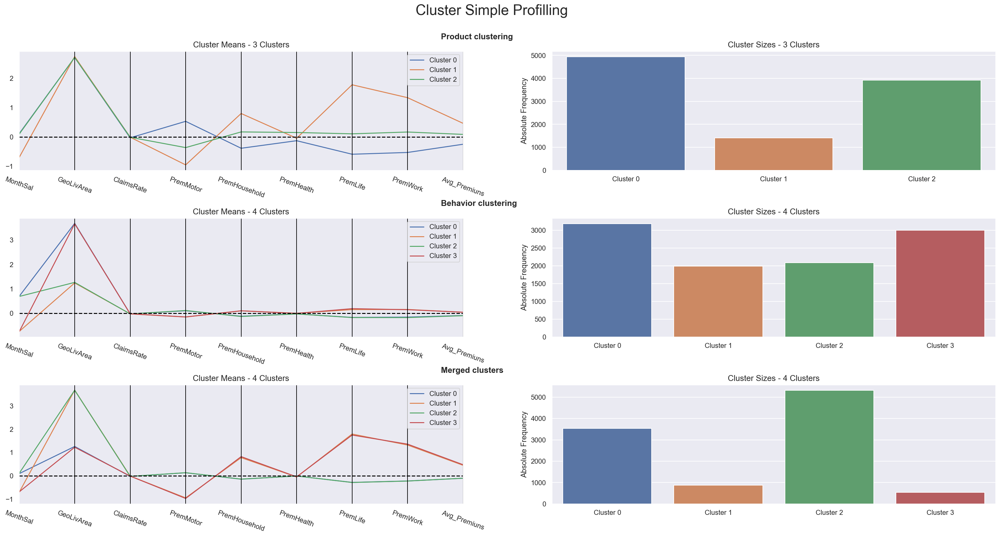

In [664]:
# Profilling each cluster (product, behavior, merged)
cluster_profiles(
    df = df[metric_features.to_list() + ['product_labels', 'behavior_labels', 'merged_labels']], 
    label_columns = ['product_labels', 'behavior_labels', 'merged_labels'], 
    figsize = (28, 13), 
    compar_titles = ["Product clustering", "Behavior clustering", "Merged clusters"]
)

### Cluster visualization using t-SNE 

In [665]:
# This is step can be quite time consuming
two_dim = TSNE(random_state=42).fit_transform(df[metric_features])

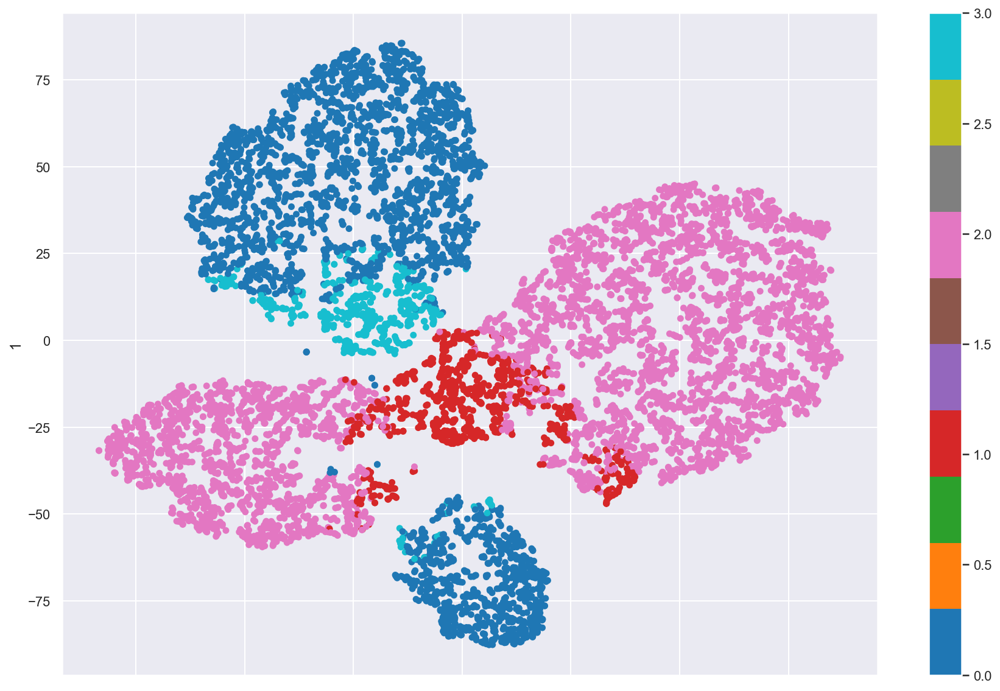

In [666]:
# t-SNE visualization
pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c=df['merged_labels'], colormap='tab10', figsize=(15,10))
plt.show()

### Using a Decision Tree 

In [667]:
# Preparing the data
X = df.drop(columns=['product_labels','behavior_labels','merged_labels'])
y = df.merged_labels

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Fitting the decision tree
dt = DecisionTreeClassifier(random_state=42, max_depth=3)
dt.fit(X_train, y_train)
print("It is estimated that in average, we are able to predict {0:.2f}% of the customers correctly".format(dt.score(X_test, y_test)*100))

It is estimated that in average, we are able to predict 96.44% of the customers correctly


In [668]:
# Assessing feature importance
pd.Series(dt.feature_importances_, index=X_train.columns)

MonthSal                 0.000000
GeoLivArea               0.669988
ClaimsRate               0.000000
PremMotor                0.000000
PremHousehold            0.000000
PremHealth               0.000000
PremLife                 0.000000
PremWork                 0.000000
Avg_Premiuns             0.000000
x0_b'2 - High School'    0.000000
x0_b'3 - BSc/MSc'        0.000000
x0_b'4 - PhD'            0.000000
x1_1.0                   0.000000
PC0                      0.270614
PC1                      0.000000
PC2                      0.059398
PC3                      0.000000
dtype: float64

In [669]:
# Predicting the cluster labels of the outliers
df_out['merged_labels'] = dt.predict(df_out.drop(columns=['CustMonVal']))
df_out.head()

,MonthSal,GeoLivArea,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns,x0_b'2 - High School',x0_b'3 - BSc/MSc',x0_b'4 - PhD',x1_1.0,PC0,PC1,PC2,PC3,merged_labels
CustID,,,,,,,,,,,,,,,,,,,
52.0,0.629541,4.0,-7.653720,8.439743,1.214703,-0.540109,-0.480045,-0.776270,-0.977239,-0.344302,0.0,1.0,0.0,1.0,-2.689790,11.104856,1.471543,-0.608715,2
113.0,-0.132122,1.0,-4.572573,5.110777,1.029786,-0.584213,-0.390990,-0.799754,-0.589634,-0.364564,0.0,0.0,1.0,1.0,-1.961725,6.650630,0.871085,-0.763219,0
136.0,-0.286185,4.0,-5.333151,4.819364,-0.013491,-0.135094,-0.095290,2.005222,-0.860314,-0.059487,0.0,1.0,0.0,1.0,-0.205014,7.209602,-0.217672,-0.254759,2
150.0,-1.317891,4.0,0.039994,-0.038663,-1.113491,-0.037385,-0.480045,-0.489383,7.997307,-0.007379,0.0,0.0,0.0,1.0,3.418939,0.362173,-3.014148,0.842327,1
172.0,-1.229607,4.0,-85.242773,87.580672,0.366836,-0.373055,-0.016006,-0.736284,-0.442309,-0.246450,0.0,1.0,0.0,1.0,-10.607191,121.445615,7.524695,-3.722735,2
